In [ ]:
import os
import shutil #https://docs.python.org/3/library/shutil.html
from shutil import unpack_archive # to unzip
#from shutil import make_archive # to create zip for storage
import requests #for downloading zip file
from scipy import io #for loadmat, matlab conversion
import pandas as pd
import numpy as np
import torch
#import matplotlib.pyplot as plt # for plotting - pandas uses matplotlib
from tabulate import tabulate # for verbose tables
from tensorflow.keras.utils import to_categorical # for one-hot encoding

In [ ]:
#credit https://stackoverflow.com/questions/9419162/download-returned-zip-file-from-url
#many other methods I tried failed to download the file properly
def download_url(url, save_path, chunk_size=128):
    r = requests.get(url, stream=True)
    with open(save_path, 'wb') as fd:
        for chunk in r.iter_content(chunk_size=chunk_size):
            fd.write(chunk)

In [ ]:
def unimib_load_dataset(
    verbose = True,
    incl_xyz_accel = False, #include component accel_x/y/z in ____X data
    incl_rms_accel = True, #add rms value (total accel) of accel_x/y/z in ____X data
    incl_val_group = False, #True => returns x/y_test, x/y_validation, x/y_train
                           #False => combine test & validation groups
    split_subj = dict
                (train_subj = [4,5,6,7,8,10,11,12,14,15,19,20,21,22,24,26,27,29],
                validation_subj = [1,9,16,23,25,28],
                test_subj = [2,3,13,17,18,30]),
    one_hot_encode = True):
    #Download and unzip original dataset
    if (not os.path.isfile('./UniMiB-SHAR.zip')):
        print("Downloading UniMiB-SHAR.zip file")
        #invoking the shell command fails when exported to .py file
        #redirect link https://www.dropbox.com/s/raw/x2fpfqj0bpf8ep6/UniMiB-SHAR.zip
        #!wget https://www.dropbox.com/s/x2fpfqj0bpf8ep6/UniMiB-SHAR.zip
        download_url('https://www.dropbox.com/s/raw/x2fpfqj0bpf8ep6/UniMiB-SHAR.zip','./UniMiB-SHAR.zip')
    if (not os.path.isdir('./UniMiB-SHAR')):
        shutil.unpack_archive('./UniMiB-SHAR.zip','.','zip')
    #Convert .mat files to numpy ndarrays
    path_in = './UniMiB-SHAR/data'
    #loadmat loads matlab files as dictionary, keys: header, version, globals, data
    adl_data = io.loadmat(path_in + '/adl_data.mat')['adl_data']
    adl_names = io.loadmat(path_in + '/adl_names.mat', chars_as_strings=True)['adl_names']
    adl_labels = io.loadmat(path_in + '/adl_labels.mat')['adl_labels']

    if(verbose):
        headers = ("Raw data","shape", "object type", "data type")
        mydata = [("adl_data:", adl_data.shape, type(adl_data), adl_data.dtype),
                ("adl_labels:", adl_labels.shape ,type(adl_labels), adl_labels.dtype),
                ("adl_names:", adl_names.shape, type(adl_names), adl_names.dtype)]
        print(tabulate(mydata, headers=headers))
    #Reshape data and compute total (rms) acceleration
    num_samples = 151
    #UniMiB SHAR has fixed size of 453 which is 151 accelX, 151 accely, 151 accelz
    adl_data = np.reshape(adl_data,(-1,num_samples,3), order='F') #uses Fortran order
    if (incl_rms_accel):
        rms_accel = np.sqrt((adl_data[:,:,0]**2) + (adl_data[:,:,1]**2) + (adl_data[:,:,2]**2))
        adl_data = np.dstack((adl_data,rms_accel))
    #remove component accel if needed
    if (not incl_xyz_accel):
        adl_data = np.delete(adl_data, [0,1,2], 2)
    if(verbose):
        headers = ("Reshaped data","shape", "object type", "data type")
        mydata = [("adl_data:", adl_data.shape, type(adl_data), adl_data.dtype),
                ("adl_labels:", adl_labels.shape ,type(adl_labels), adl_labels.dtype),
                ("adl_names:", adl_names.shape, type(adl_names), adl_names.dtype)]
        print(tabulate(mydata, headers=headers))
    #Split train/test sets, combine or make separate validation set
    #ref for this numpy gymnastics - find index of matching subject to sub_train/sub_test/sub_validate
    #https://numpy.org/doc/stable/reference/generated/numpy.isin.html


    act_num = (adl_labels[:,0])-1 #matlab source was 1 indexed, change to 0 indexed
    sub_num = (adl_labels[:,1]) #subject numbers are in column 1 of labels

    if (not incl_val_group):
        train_index = np.nonzero(np.isin(sub_num, split_subj['train_subj'] +
                                        split_subj['validation_subj']))
        x_train = adl_data[train_index]
        y_train = act_num[train_index]
    else:
        train_index = np.nonzero(np.isin(sub_num, split_subj['train_subj']))
        x_train = adl_data[train_index]
        y_train = act_num[train_index]

        validation_index = np.nonzero(np.isin(sub_num, split_subj['validation_subj']))
        x_validation = adl_data[validation_index]
        y_validation = act_num[validation_index]

    test_index = np.nonzero(np.isin(sub_num, split_subj['test_subj']))
    x_test = adl_data[test_index]
    y_test = act_num[test_index]

    if (verbose):
        print("x/y_train shape ",x_train.shape,y_train.shape)
        if (incl_val_group):
            print("x/y_validation shape ",x_validation.shape,y_validation.shape)
        print("x/y_test shape  ",x_test.shape,y_test.shape)
    #If selected one-hot encode y_* using keras to_categorical, reference:
    #https://keras.io/api/utils/python_utils/#to_categorical-function and
    #https://machinelearningmastery.com/how-to-one-hot-encode-sequence-data-in-python/
    if (one_hot_encode):
        y_train = to_categorical(y_train, num_classes=9)
        if (incl_val_group):
            y_validation = to_categorical(y_validation, num_classes=9)
        y_test = to_categorical(y_test, num_classes=9)
        if (verbose):
            print("After one-hot encoding")
            print("x/y_train shape ",x_train.shape,y_train.shape)
            if (incl_val_group):
                print("x/y_validation shape ",x_validation.shape,y_validation.shape)
            print("x/y_test shape  ",x_test.shape,y_test.shape)
    if (incl_val_group):
        return x_train, y_train, x_validation, y_validation, x_test, y_test
    else:
        return x_train, y_train, x_test, y_test

In [ ]:
if __name__ == "__main__":
    print("Downloading and processing UniMiB SHAR dataset, ADL Portion")
    x_train, y_train, x_val, y_val, x_test, y_test = unimib_load_dataset(incl_val_group=True, one_hot_encode = False)
    print("\nUniMiB SHAR returned arrays:")
    print("x_train shape ",x_train.shape," y_train shape ", y_train.shape)
    print("x_test shape  ",x_test.shape," y_test shape  ",y_test.shape)

Raw data     shape        object type              data type
-----------  -----------  -----------------------  -----------
adl_data:    (7579, 453)  <class 'numpy.ndarray'>  float64
adl_labels:  (7579, 3)    <class 'numpy.ndarray'>  uint8
adl_names:   (9, 1)       <class 'numpy.ndarray'>  object
Reshaped data    shape           object type              data type
---------------  --------------  -----------------------  -----------
adl_data:        (7579, 151, 1)  <class 'numpy.ndarray'>  float64
adl_labels:      (7579, 3)       <class 'numpy.ndarray'>  uint8
adl_names:       (9, 1)          <class 'numpy.ndarray'>  object
x/y_train shape  (4601, 151, 1) (4601,)
x/y_validation shape  (1454, 151, 1) (1454,)
x/y_test shape   (1524, 151, 1) (1524,)

UniMiB SHAR returned arrays:
x_train shape  (4601, 151, 1)  y_train shape  (4601,)
x_test shape   (1524, 151, 1)  y_test shape   (1524,)


In [ ]:
x_train_df=pd.DataFrame(x_train.reshape(x_train.shape[0], x_train.shape[1]))
x_val_df=pd.DataFrame(x_val.reshape(x_val.shape[0], x_val.shape[1]))
x_test_df=pd.DataFrame(x_test.reshape(x_test.shape[0], x_test.shape[1]))
y_train=pd.DataFrame(y_train)
y_val=pd.DataFrame(y_val)
y_test=pd.DataFrame(y_test)

In [ ]:
train_sct, val_sct, test_sct = embd.std_scaling(x_train_df, x_val_df, x_test_df)

In [ ]:
train_emb, val_emb, test_emb = embd.pca_embedding(train_sct, val_sct, test_sct,96)

In [ ]:
#to save and load the work later on,
np.savetxt('um_pca_embeddings.txt', train_emb)
np.savetxt('um_pca_embeddings.txt', test_emb)
np.savetxt('um_pca_embeddings.txt', val_emb)

In [ ]:
ny_train=y_train
ny_test=y_test
ny_val=y_val

ROBUST CONSISTENT UMAP ANALYSIS

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

2. Autoencoder Embedding:
  Processing Autoencoder...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
  ✓ Autoencoder completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:

8. TDA Embedding:
  TDA input format check - first element type: <class 'numpy.ndarray'>, shape: (151,)
  Processing TDA...
  ✓ TDA completed successfully

Successfully generated 7 out of 8 embedding methods:
  ✓ PCA
  ✓ Autoencoder
  ✓ FFT
  ✓ Wavelet
  ✓ LLE
  ✓ UMAP
  ✓ TDA
Failed methods: Graph

STEP 2: Creating consistent UMAP layouts...
--------------------------------------------------
Creating consistent UMAP layouts using PCA as reference...
  PCA test embedding shape: (1524, 96)
  Autoencoder test embedding sh

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for Autoencoder...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Autoencoder layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)
Generating layout for TDA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ TDA layout created: (1524, 2)

Successfully created 7 consistent UMAP layouts!

STEP 3: Creating visualization...
--------------------------------------------------
Creating grid plot: 2x4 for 7 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: robust_consistent_umap_comparison.png


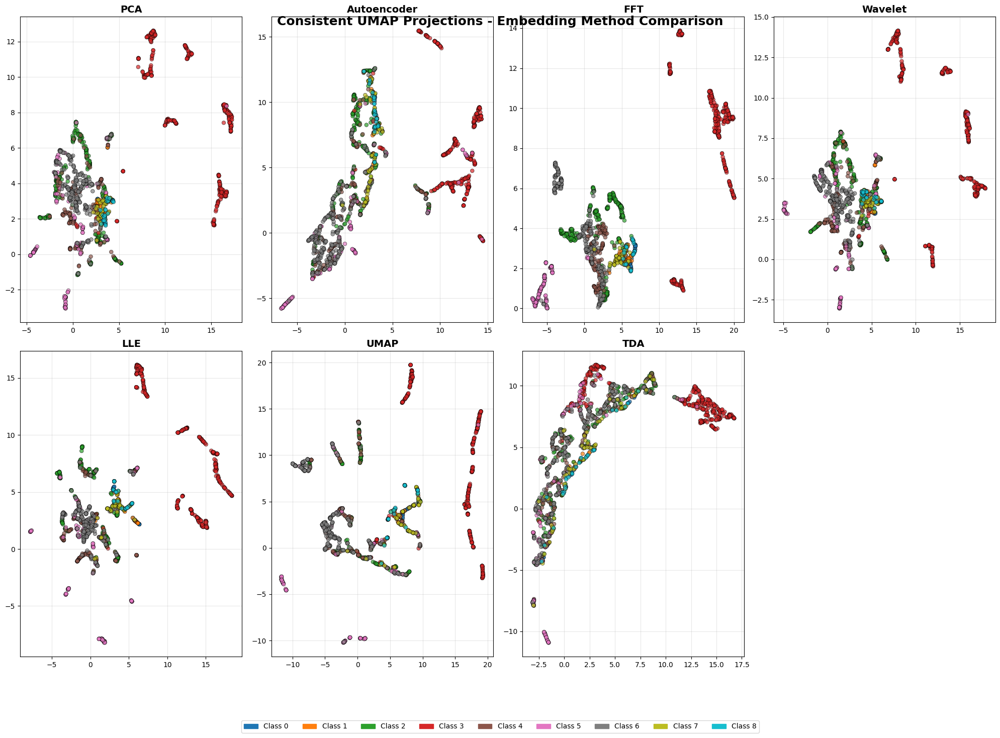


🎉 ANALYSIS COMPLETE!
✅ Successfully processed 7 embedding methods
✅ Successfully created 7 UMAP visualizations
✅ Plots saved and displayed

Now you can fairly compare embedding quality!


In [ ]:
import New6 as new
# Use the robust version instead
embeddings_results, layouts_2d = new.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

COMPREHENSIVE ROBUST CONSISTENT UMAP ANALYSIS
Traditional Methods + Deep Learning (NNCLR) Methods

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

2. Autoencoder Embedding:
  Processing Autoencoder...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
  ✓ Autoencoder completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:
  Processing Graph...
  ✓ Graph completed successfully

8. TDA Embedding:
  TDA input format check - first element type: <class 'numpy.ndarray'>, shape: (151,)
  Processing TDA...
  ✓ TDA completed successfully

DEEP LEARNING METHODS (NNCLR-based)

9. NNCLR CNN Embedding:
  ✗ Could not import nnclr_embdcnn2: No module named 'scripts'

10. NNCLR LSTM Embedding:
  ✗ Could not import nnclr_embd_rnn: No module named 'scripts'

11. NNCLR Transformer Embedding:
  ✗ Could not import nnclr_embd_transformer: No module named 'scri

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for Autoencoder...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Autoencoder layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)
Generating layout for Graph...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Graph layout created: (1524, 2)
Generating layout for TDA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ TDA layout created: (1524, 2)

Successfully created 8 consistent UMAP layouts!

STEP 3: Creating comprehensive visualization...
--------------------------------------------------
Creating grid plot: 2x4 for 8 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: comprehensive_consistent_umap_comparison.png


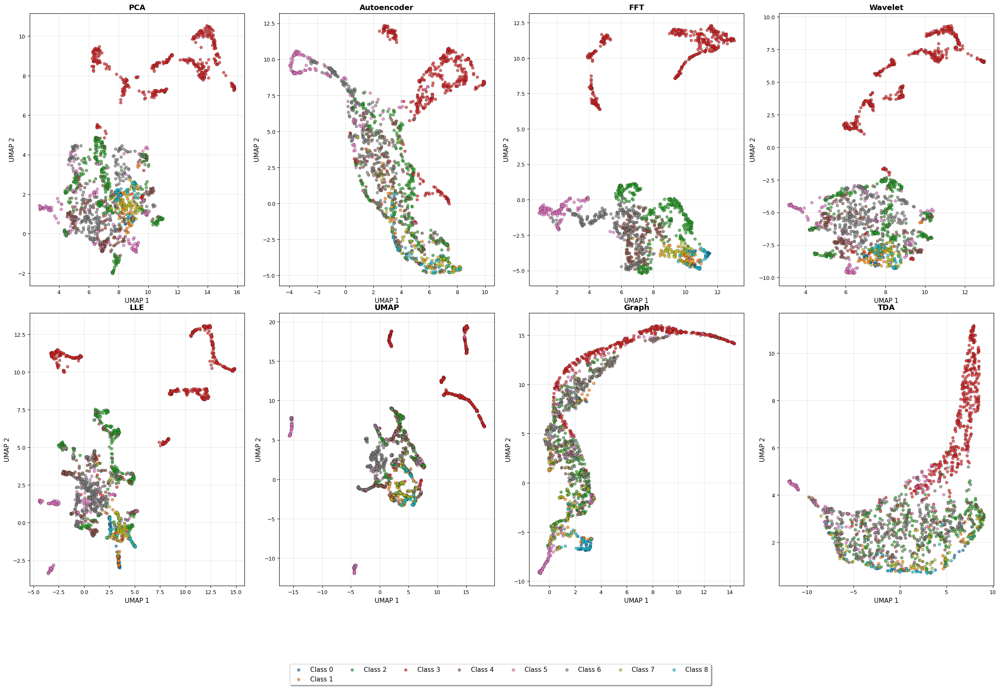


STEP 4: Creating deep learning methods comparison...
--------------------------------------------------
No deep learning methods available for separate comparison.

🎉 COMPREHENSIVE ANALYSIS COMPLETE!
✅ Successfully processed 8 embedding methods
✅ Successfully created 8 UMAP visualizations
✅ Comprehensive comparison plot created
✅ All plots saved and displayed

Now you can compare:
• Traditional embedding methods vs Deep Learning methods
• Different NNCLR architectures (CNN, LSTM, Transformer)
• Overall clustering quality across all approaches


In [ ]:
# Import your robust analysis
import Newdeep as robust  # Replace with your filename

# Run the complete analysis
embeddings_results, layouts_2d = robust.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

COMPREHENSIVE ROBUST CONSISTENT UMAP ANALYSIS
Traditional Methods + Deep Learning (NNCLR) Methods

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:

8. TDA Embedding:

DEEP LEARNING METHODS (NNCLR-based)

9. NNCLR CNN Embedding:
  Processing NNCLR CNN...
x_train_df shape: (4601, 151)
y_train    shape: (4601,)
x_val_df   shape: (1454, 151)
y_val      shape: (1454,)
x_test_df  shape: (1524, 151)
y_t

Model: "encoder_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 151, 100)       │         1,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 151, 100)       │       100,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 151, 100)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 76, 100)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 100)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        12,928 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 114,128 (445.81 KB)

 Trainable params: 114,128 (445.81 KB)

 Non-trainable params: 0 (0.00 B)

None


Model: "nnclr"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ contrastive_augmenter           │ (None, None, 1)        │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_augmenter        │ (None, None, 1)        │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_model (Sequential)      │ (None, 128)            │       114,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ projection_head (Sequential)    │ (None, 128)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ linear_probe (Sequential)       │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 148,313 (579.35 KB)

 Trainable params: 148,313 (579.35 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/100
46/46 - 15s - 331ms/step - c_acc: 0.0921 - c_loss: 2.5151 - p_acc: 0.0014 - p_loss: 2.2327 - r_acc: 0.0857 - val_p_acc: 0.4232 - val_p_loss: 2.2321
Epoch 2/100
46/46 - 1s - 26ms/step - c_acc: 0.1126 - c_loss: 2.6357 - p_acc: 0.2414 - p_loss: 2.2555 - r_acc: 0.1131 - val_p_acc: 0.2999 - val_p_loss: 2.2524
Epoch 3/100
46/46 - 1s - 19ms/step - c_acc: 0.1251 - c_loss: 2.4042 - p_acc: 0.2916 - p_loss: 2.2842 - r_acc: 0.1264 - val_p_acc: 0.2887 - val_p_loss: 2.2809
Epoch 4/100
46/46 - 1s - 18ms/step - c_acc: 0.1288 - c_loss: 2.4451 - p_acc: 0.2799 - p_loss: 2.3030 - r_acc: 0.1478 - val_p_acc: 0.2828 - val_p_loss: 2.2989
Epoch 5/100
46/46 - 1s - 18ms/step - c_acc: 0.1586 - c_loss: 2.3762 - p_acc: 0.2813 - p_loss: 2.3176 - r_acc: 0.1754 - val_p_acc: 0.3117 - val_p_loss: 2.3135
Epoch 6/100
46/46 - 1s - 30ms/step - c_acc: 0.1435 - c_loss: 2.4639 - p_acc: 0.2999 - p_loss: 2.3591 - r_acc: 0.1694 - val_p_acc: 0.2795 - val_p_loss: 2.3475
Epoch 7/100
46/46 - 1s - 19ms/step - c_acc: 0

Model: "encoder_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 151, 128)       │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 151, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 151, 128)       │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 151, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        16,512 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 214,656 (838.50 KB)

 Trainable params: 214,656 (838.50 KB)

 Non-trainable params: 0 (0.00 B)

None


Model: "nnclr_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ contrastive_augmenter           │ (None, None, 1)        │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_augmenter        │ (None, None, 1)        │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_model (Sequential)      │ (None, 128)            │       214,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ projection_head (Sequential)    │ (None, 128)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ linear_probe (Sequential)       │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 248,841 (972.04 KB)

 Trainable params: 248,841 (972.04 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/200
46/46 - 9s - 193ms/step - c_acc: 0.0410 - c_loss: 3.2626 - p_acc: 0.0275 - p_loss: 2.2237 - r_acc: 0.0280 - val_p_acc: 0.2717 - val_p_loss: 2.2231
Epoch 2/200
46/46 - 2s - 47ms/step - c_acc: 0.0456 - c_loss: 3.2988 - p_acc: 0.2001 - p_loss: 2.2528 - r_acc: 0.0284 - val_p_acc: 0.2710 - val_p_loss: 2.2498
Epoch 3/200
46/46 - 2s - 47ms/step - c_acc: 0.0521 - c_loss: 3.1838 - p_acc: 0.2338 - p_loss: 2.2809 - r_acc: 0.0346 - val_p_acc: 0.2710 - val_p_loss: 2.2775
Epoch 4/200
46/46 - 2s - 48ms/step - c_acc: 0.0771 - c_loss: 3.0573 - p_acc: 0.2806 - p_loss: 2.3171 - r_acc: 0.0493 - val_p_acc: 0.2710 - val_p_loss: 2.3127
Epoch 5/200
46/46 - 2s - 40ms/step - c_acc: 0.0991 - c_loss: 2.8288 - p_acc: 0.2806 - p_loss: 2.3226 - r_acc: 0.0722 - val_p_acc: 0.2710 - val_p_loss: 2.3133
Epoch 6/200
46/46 - 2s - 40ms/step - c_acc: 0.1118 - c_loss: 2.7759 - p_acc: 0.2806 - p_loss: 2.3962 - r_acc: 0.0683 - val_p_acc: 0.2710 - val_p_loss: 2.3876
Epoch 7/200
46/46 - 2s - 47ms/step - c_acc: 0.

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)
Generating layout for NNCLR CNN...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ NNCLR CNN layout created: (1524, 2)
Generating layout for NNCLR LSTM...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ NNCLR LSTM layout created: (1524, 2)

Successfully created 7 consistent UMAP layouts!

STEP 3: Creating comprehensive visualization...
--------------------------------------------------
Creating grid plot: 2x4 for 7 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: comprehensive_consistent_umap_comparison.png


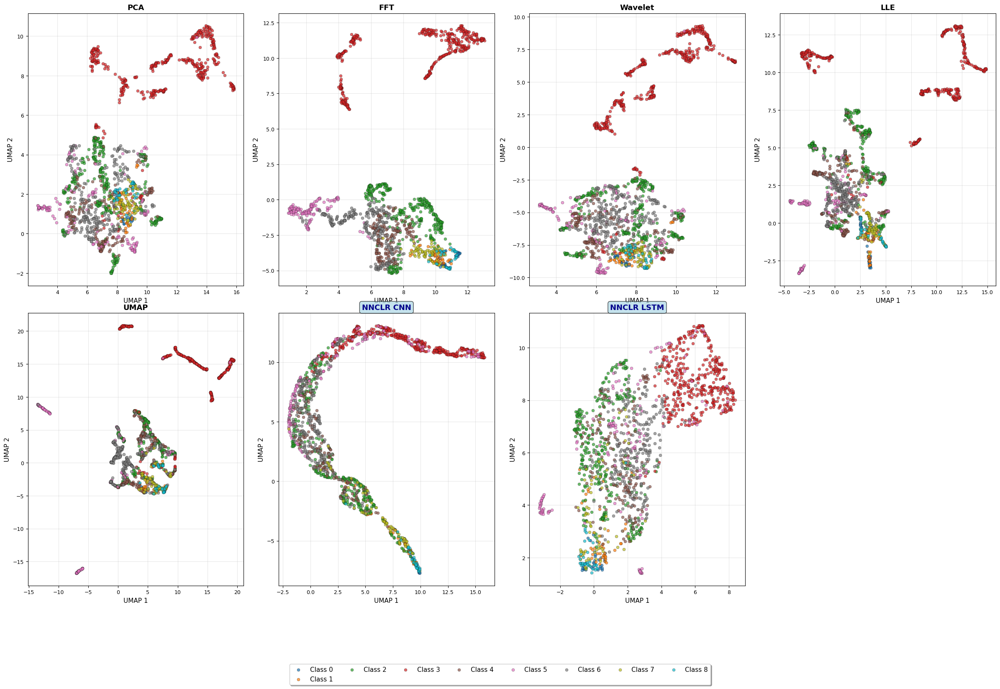


STEP 4: Creating deep learning methods comparison...
--------------------------------------------------
Deep learning comparison saved to: nnclr_methods_comparison.png


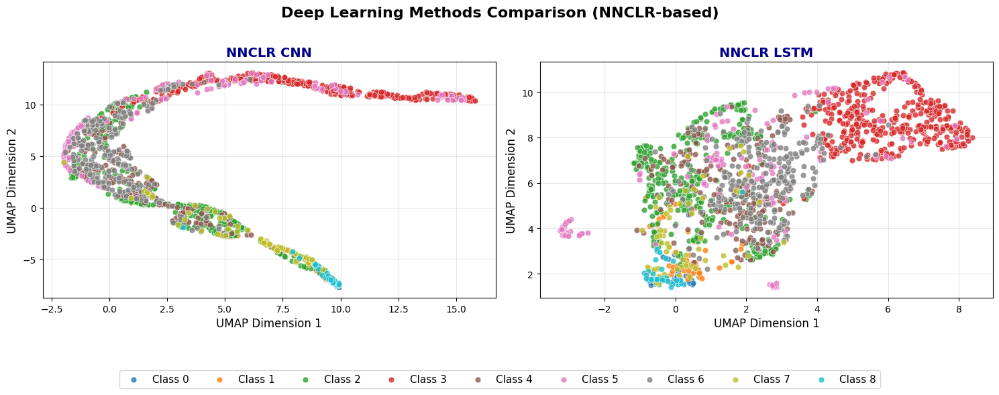


🎉 COMPREHENSIVE ANALYSIS COMPLETE!
✅ Successfully processed 7 embedding methods
✅ Successfully created 7 UMAP visualizations
✅ Comprehensive comparison plot created
✅ Deep learning methods comparison created (2 methods)
✅ All plots saved and displayed

Now you can compare:
• Traditional embedding methods vs Deep Learning methods
• Different NNCLR architectures (CNN, LSTM, Transformer)
• Overall clustering quality across all approaches


In [ ]:
# Import your robust analysis
import Newdeep1 as robust  # Replace with your filename

# Run the complete analysis
embeddings_results, layouts_2d = robust.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

COMPREHENSIVE ROBUST CONSISTENT UMAP ANALYSIS
Traditional Methods + Deep Learning (NNCLR) Methods

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

2. Autoencoder Embedding:
  Processing Autoencoder...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
  ✓ Autoencoder completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:

8. TDA Embedding:

DEEP LEARNING METHODS (NNCLR-based)

9. NNCLR CNN Embedding:

10. NNCLR LSTM Embedding:

11. NNCLR Transformer Embedding:

Successfully generated 6 out of 11 embedding methods:
  ✓ PCA
  ✓ Autoencoder
  ✓ FFT
  ✓ Wavelet
  ✓ LLE
  ✓ UMAP
Failed methods: TDA, Graph, NNCLR LSTM, NNCLR Transformer, NNCLR CNN

STEP 2: Creating consistent UMAP layouts...
--------------------------------------------------
Creating consistent UMAP layouts using PCA as reference...
  PCA test embedding shape: (1524, 96)
  Aut

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for Autoencoder...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Autoencoder layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)

Successfully created 6 consistent UMAP layouts!

STEP 3: Creating comprehensive visualization...
--------------------------------------------------
Creating grid plot: 2x3 for 6 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: comprehensive_consistent_umap_comparison.png


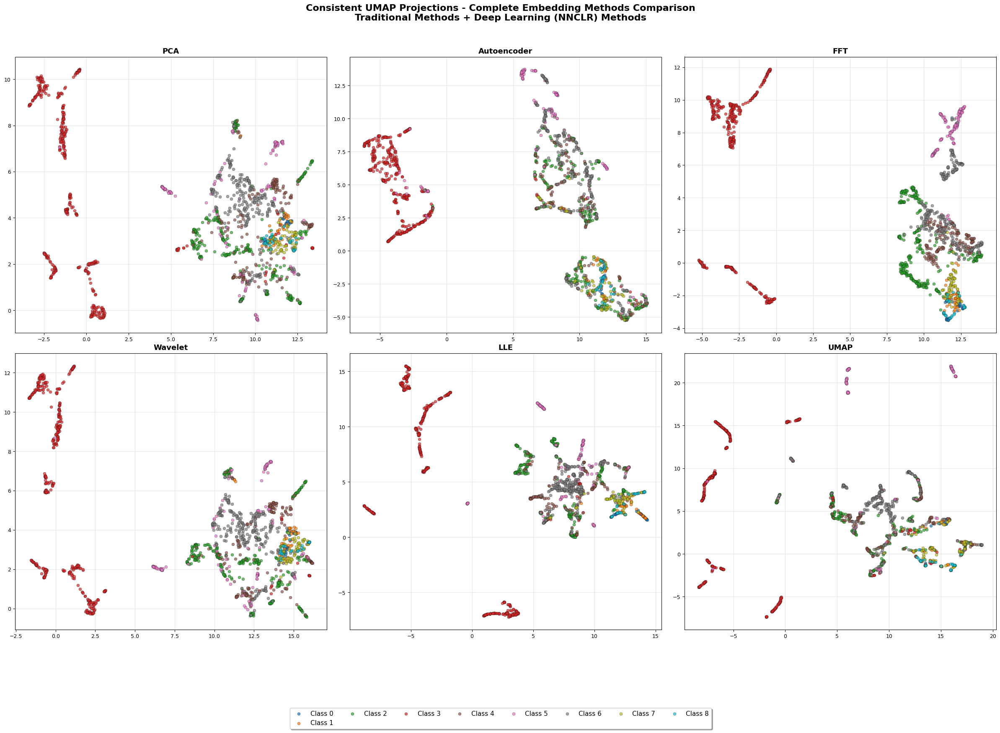


STEP 4: Creating deep learning methods comparison...
--------------------------------------------------
No deep learning methods available for separate comparison.

🎉 COMPREHENSIVE ANALYSIS COMPLETE!
✅ Successfully processed 6 embedding methods
✅ Successfully created 6 UMAP visualizations
✅ Comprehensive comparison plot created
✅ All plots saved and displayed

Now you can compare:
• Traditional embedding methods vs Deep Learning methods
• Different NNCLR architectures (CNN, LSTM, Transformer)
• Overall clustering quality across all approaches


In [ ]:
import Newplot as robust  # Replace with your filename

embeddings_results, layouts_2d = robust.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

Individual plot saved: individual_(a)_transformer_umap.png


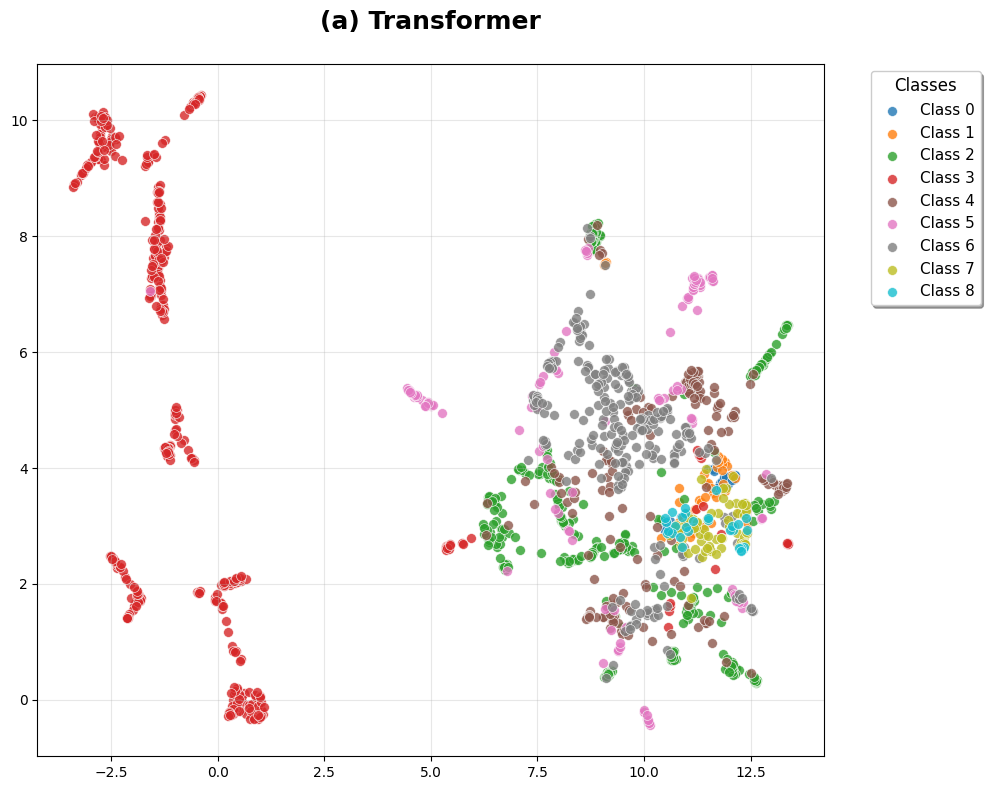

In [ ]:
# 2. Create individual plots with your preferred labels
robust.plot_individual_method(layouts_2d, 'NNCLR Transformer', ny_test, custom_label='(a) Transformer')
#plot_individual_method(layouts_2d, 'CNN', ny_test, custom_label='(b) CNN-NNCLR Method')
#plot_individual_method(layouts_2d, 'LSTM', ny_test, custom_label='(c) LSTM-NNCLR Method')

Individual plot saved: individual_(a)_pca_umap.png


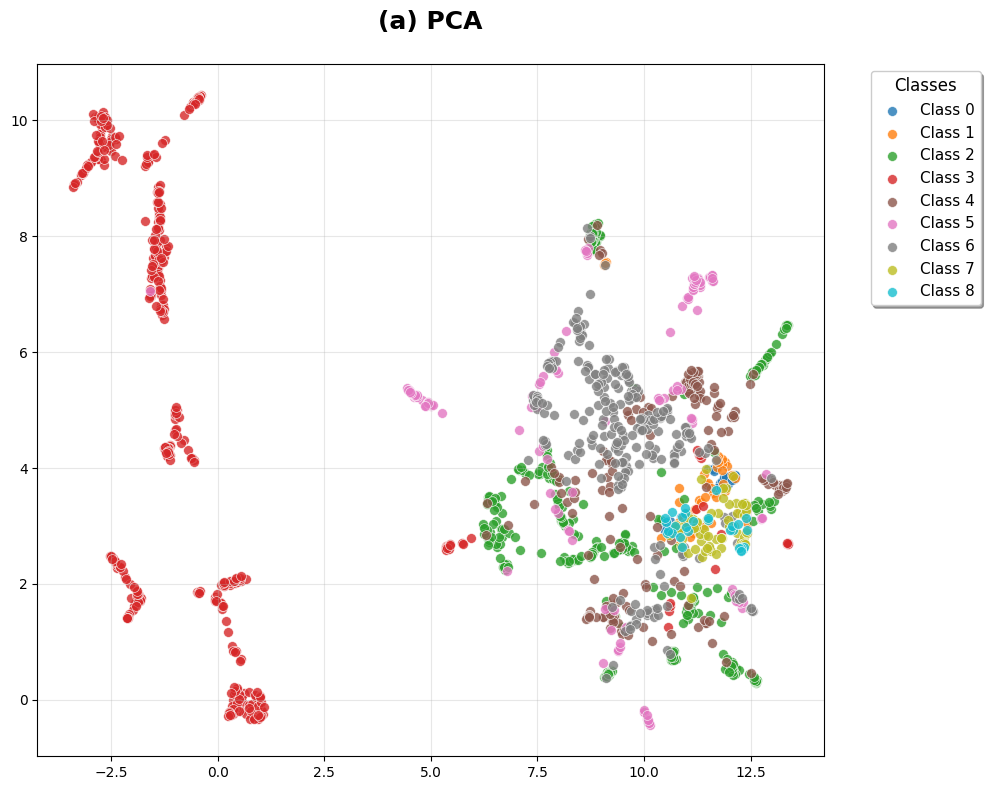

In [ ]:
# 2. Create individual plots with your preferred labels
robust.plot_individual_method(layouts_2d, 'PCA', ny_test, custom_label='(a) PCA')
#plot_individual_method(layouts_2d, 'CNN', ny_test, custom_label='(b) CNN-NNCLR Method')
#plot_individual_method(layouts_2d, 'LSTM', ny_test, custom_label='(c) LSTM-NNCLR Method')

Individual plot saved: individual_(b)_wavelet_umap.png


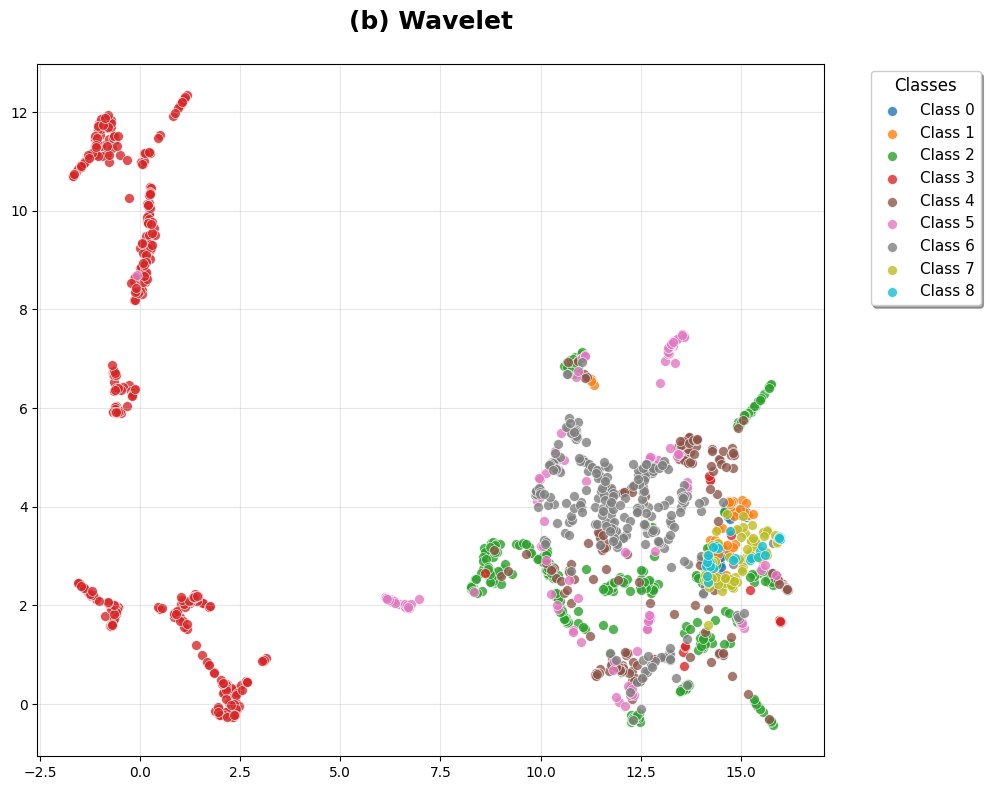

In [ ]:
# 2. Create individual plots with your preferred labels
robust.plot_individual_method(layouts_2d, 'Wavelet', ny_test, custom_label='(b) Wavelet')
#plot_individual_method(layouts_2d, 'CNN', ny_test, custom_label='(b) CNN-NNCLR Method')
#plot_individual_method(layouts_2d, 'LSTM', ny_test, custom_label='(c) LSTM-NNCLR Method')

Individual plot saved: individual_(c)_fft_umap.png


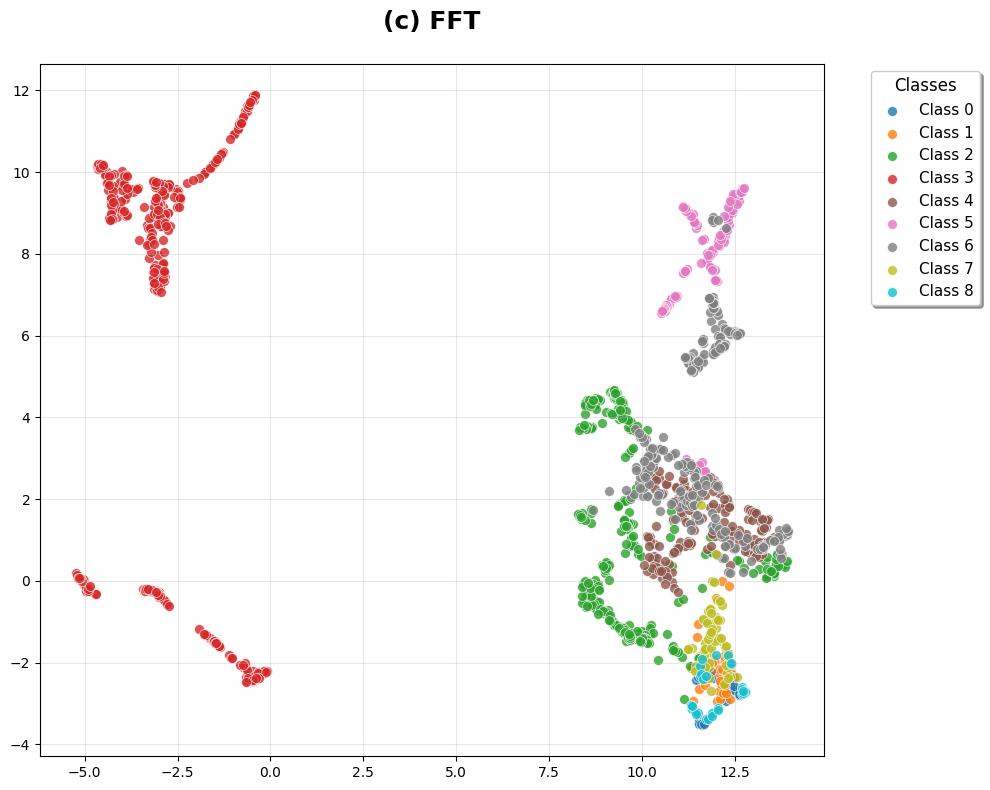

In [ ]:
# 2. Create individual plots with your preferred labels
robust.plot_individual_method(layouts_2d, 'FFT', ny_test, custom_label='(c) FFT')

Individual plot saved: individual_(d)_lle_umap.png


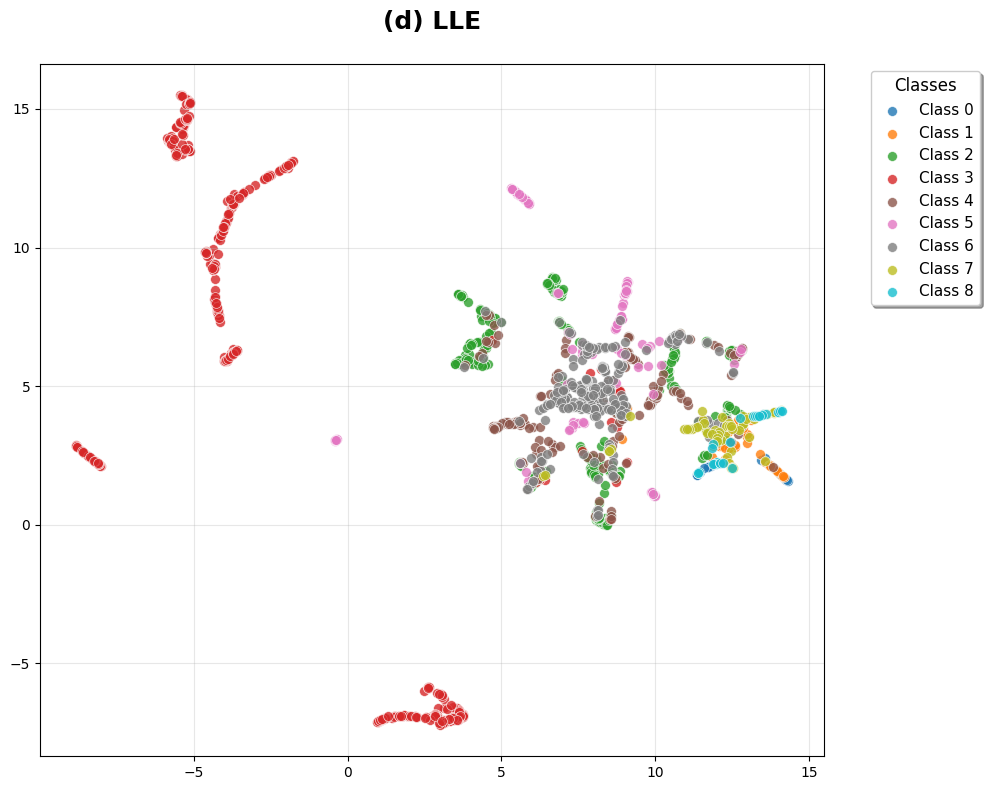

In [ ]:
# 2. Create individual plots with your preferred labels
robust.plot_individual_method(layouts_2d, 'LLE', ny_test, custom_label='(d) LLE')

Individual plot saved: individual_(e)_umap_umap.png


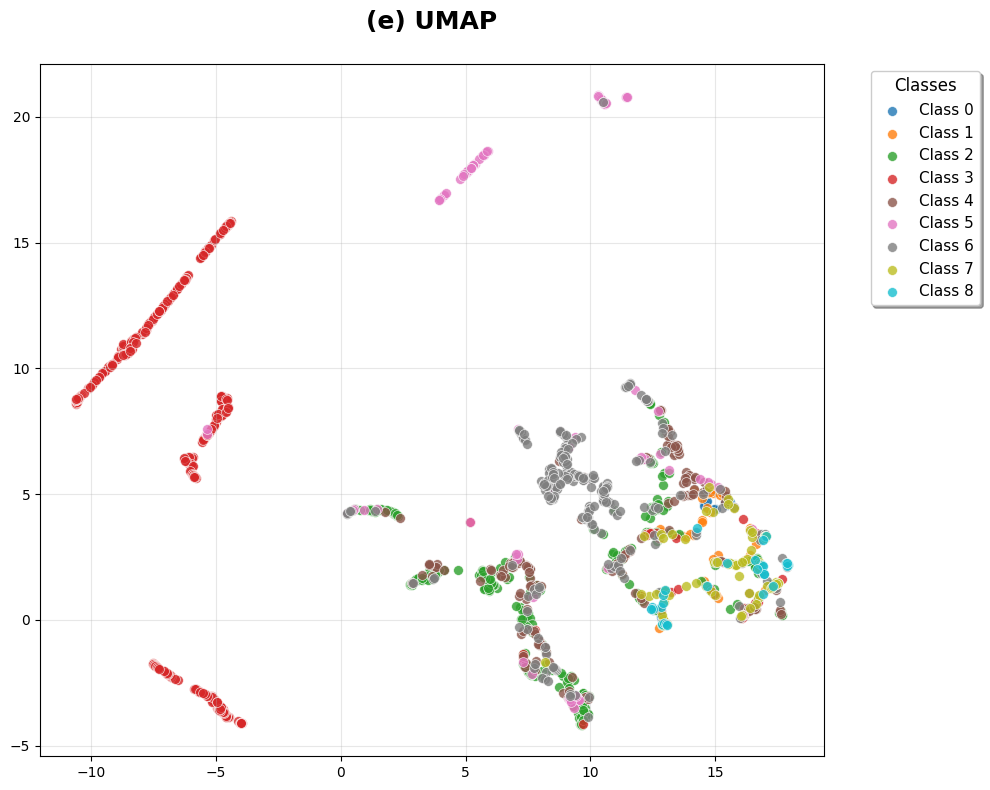

In [ ]:
# 2. Create individual plots with your preferred labels
robust.plot_individual_method(layouts_2d, 'UMAP', ny_test, custom_label='(e) UMAP')

Individual plot saved: individual_(f)_graph_umap.png


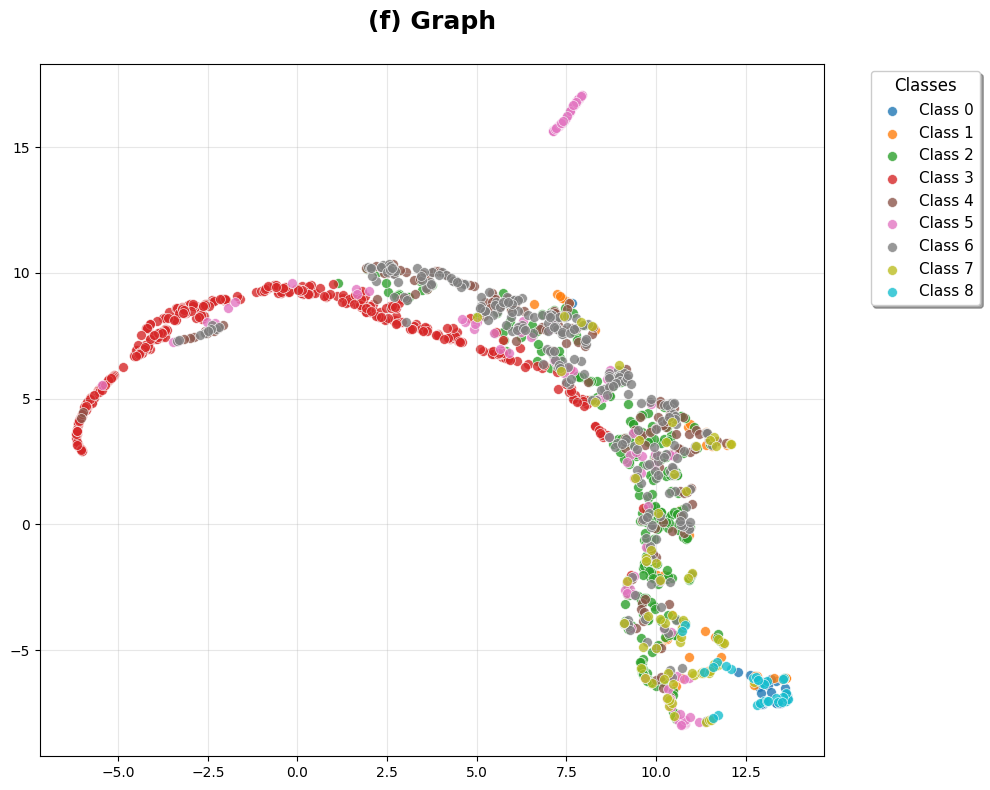

In [ ]:
robust.plot_individual_method(layouts_2d, 'Graph', ny_test, custom_label='(f) Graph')

Individual plot saved: individual_(g)_tda_umap.png


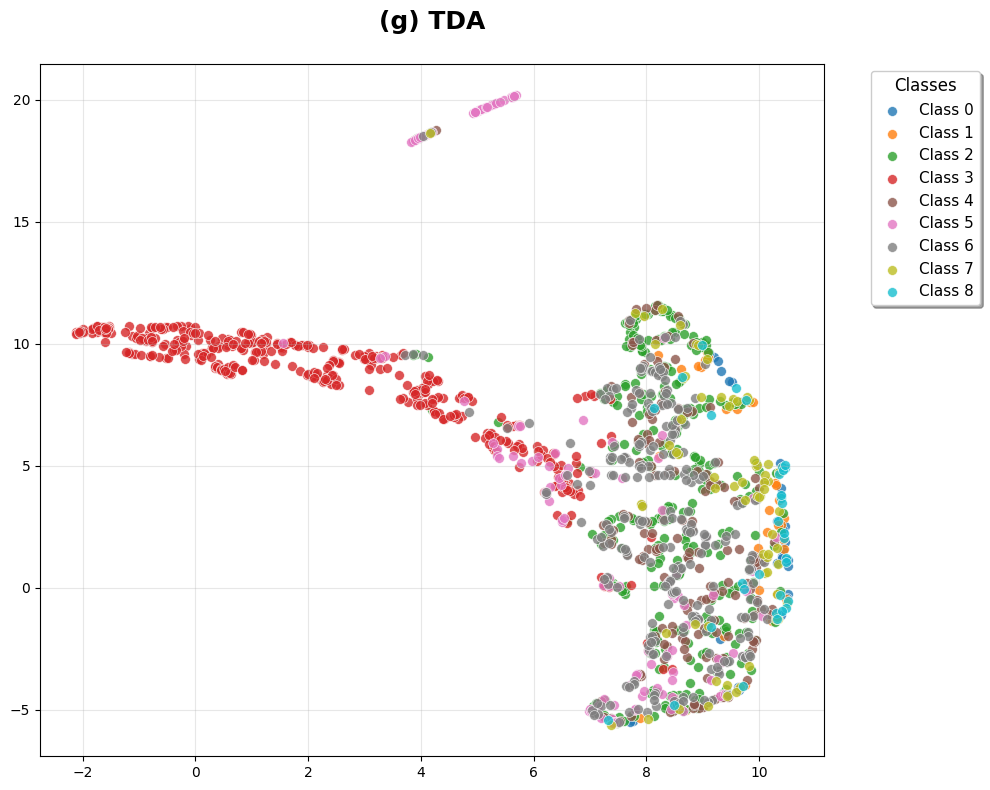

In [ ]:
robust.plot_individual_method(layouts_2d, 'TDA', ny_test, custom_label='(g) TDA')

Individual plot saved: individual_(h)_ae_umap.png


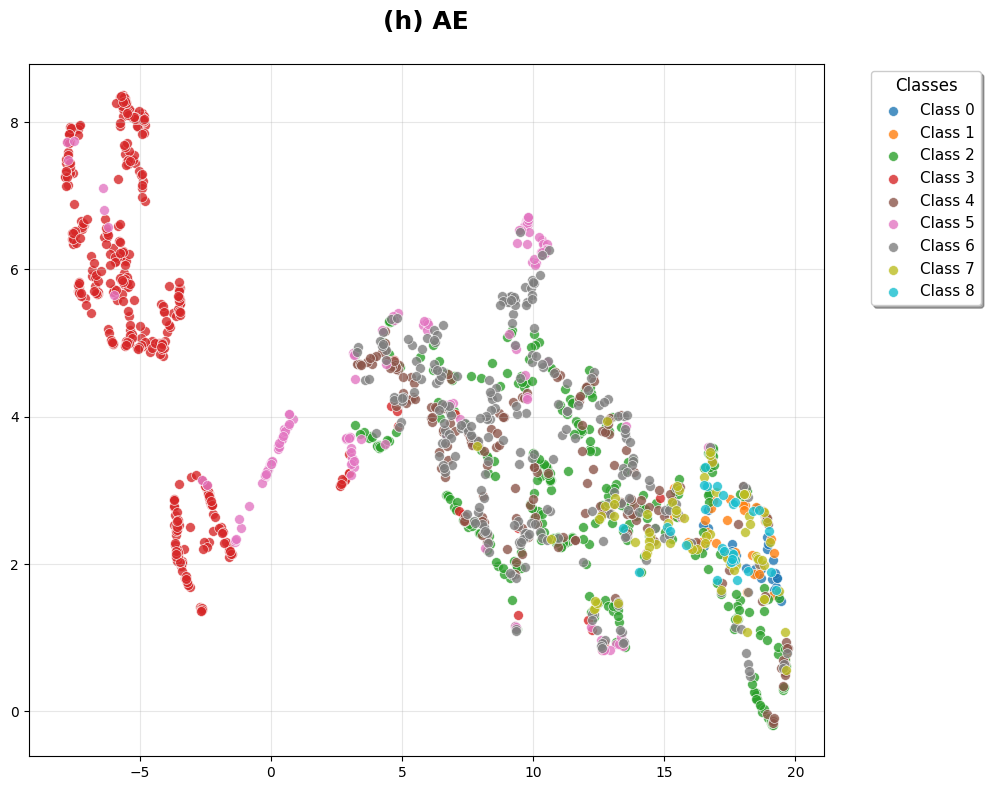

In [ ]:
robust.plot_individual_method(layouts_2d, 'Autoencoder', ny_test, custom_label='(h) AE')

Individual plot saved: individual_(i)_nnclr_cnn_umap.png


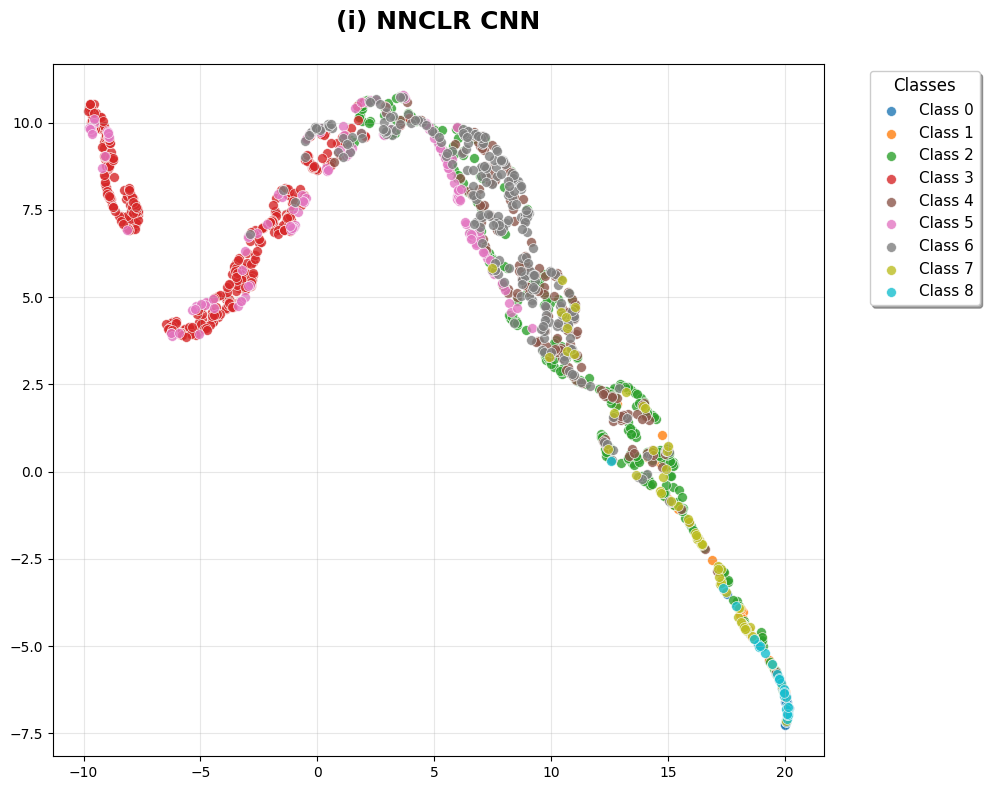

In [ ]:
robust.plot_individual_method(layouts_2d, 'NNCLR CNN', ny_test, custom_label='(i) NNCLR CNN')

Individual plot saved: individual_(j)_nnclr_lstm_umap.png


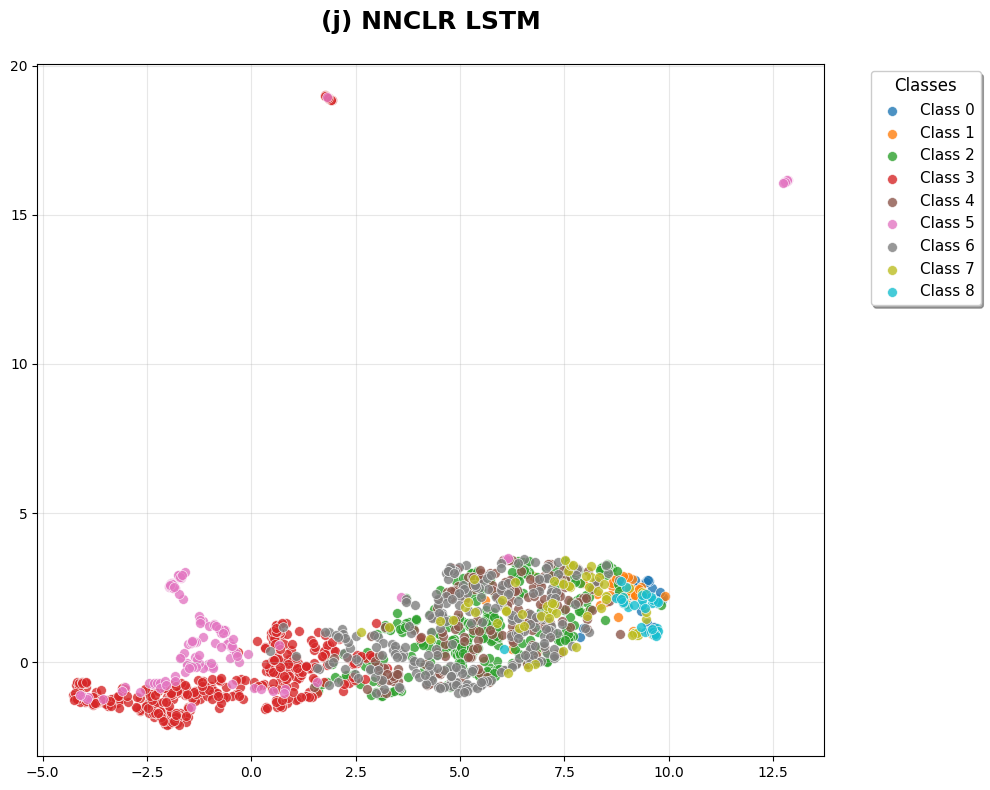

In [ ]:
robust.plot_individual_method(layouts_2d, 'NNCLR LSTM', ny_test, custom_label='(j) NNCLR LSTM')

COMPREHENSIVE ROBUST CONSISTENT UMAP ANALYSIS
Traditional Methods + Deep Learning (NNCLR) Methods

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

2. Autoencoder Embedding:
  Processing Autoencoder...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
  ✓ Autoencoder completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:

8. TDA Embedding:
  TDA input format check - first element type: <class 'numpy.ndarray'>, shape: (151,)
  Processing TDA...
  ✓ TDA completed successfully

DEEP LEARNING METHODS (NNCLR-based)

9. NNCLR CNN Embedding:

10. NNCLR LSTM Embedding:

11. NNCLR Transformer Embedding:

Successfully generated 7 out of 11 embedding methods:
  ✓ PCA
  ✓ Autoencoder
  ✓ FFT
  ✓ Wavelet
  ✓ LLE
  ✓ UMAP
  ✓ TDA
Failed methods: NNCLR LSTM, NNCLR Transformer, Graph, NNCLR CNN

STEP 2: Creating consistent UMAP layouts...
--------------

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for Autoencoder...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Autoencoder layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)
Generating layout for TDA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ TDA layout created: (1524, 2)

Successfully created 7 consistent UMAP layouts!

STEP 3: Creating comprehensive visualization...
--------------------------------------------------
Creating grid plot: 3x3 for 7 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: comprehensive_consistent_umap_comparison.png


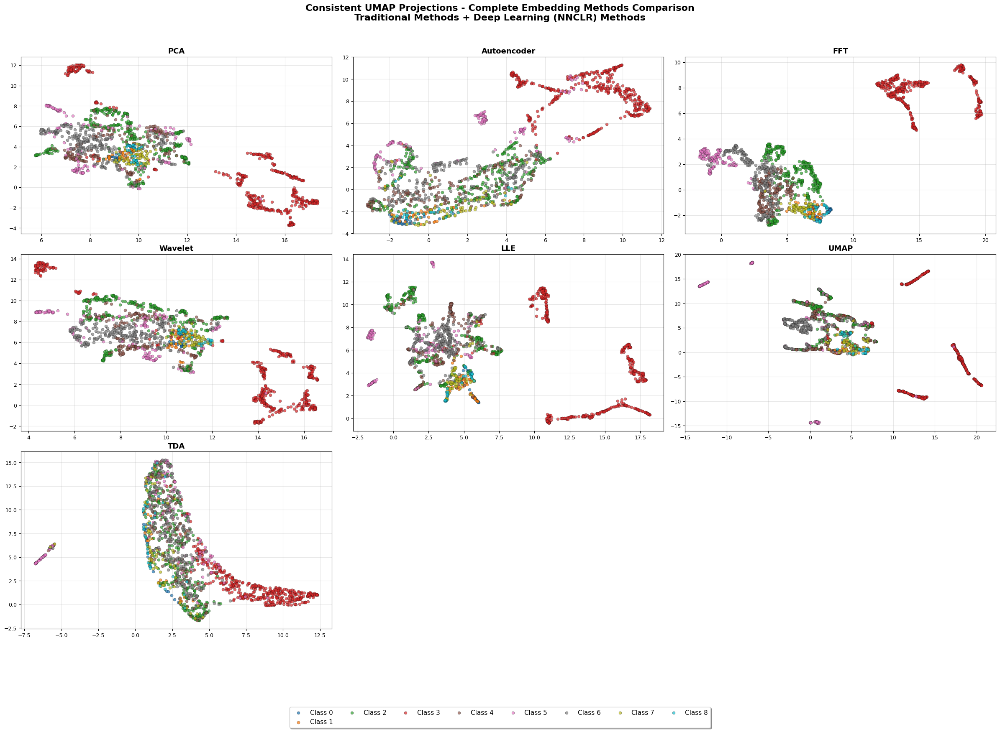


STEP 4: Creating deep learning methods comparison...
--------------------------------------------------
No deep learning methods available for separate comparison.

🎉 COMPREHENSIVE ANALYSIS COMPLETE!
✅ Successfully processed 7 embedding methods
✅ Successfully created 7 UMAP visualizations
✅ Comprehensive comparison plot created
✅ All plots saved and displayed

Now you can compare:
• Traditional embedding methods vs Deep Learning methods
• Different NNCLR architectures (CNN, LSTM, Transformer)
• Overall clustering quality across all approaches


In [ ]:
import Newplot4 as robust  # Replace with your filename

embeddings_results, layouts_2d = robust.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

Individual plot saved: individual_(k)_transformer_umap.png


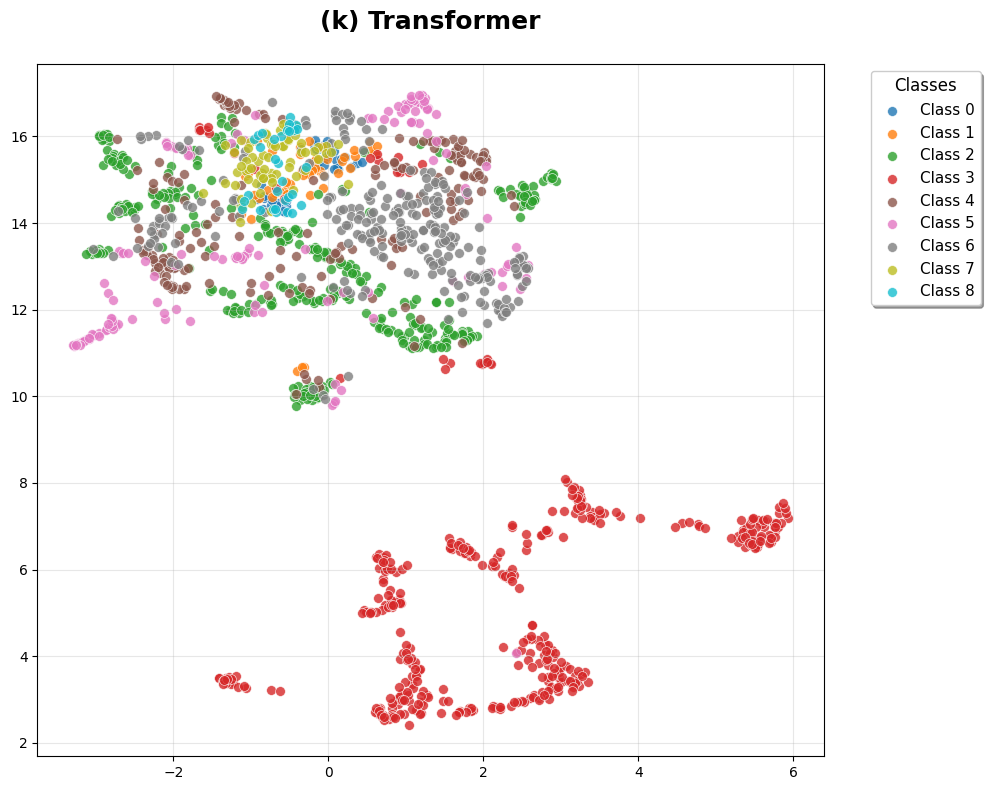

In [ ]:
robust.plot_individual_method(layouts_2d, 'NNCLR Transformer', ny_test, custom_label='(k) Transformer')

COMPREHENSIVE ROBUST CONSISTENT UMAP ANALYSIS
Traditional Methods + Deep Learning (NNCLR) Methods

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

2. Autoencoder Embedding:
  Processing Autoencoder...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
  ✓ Autoencoder completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:

8. TDA Embedding:
  TDA input format check - first element type: <class 'numpy.ndarray'>, shape: (151,)
  Processing TDA...
  ✓ TDA completed successfully

DEEP LEARNING METHODS (NNCLR-based)

9. NNCLR CNN Embedding:

10. NNCLR LSTM Embedding:

11. NNCLR Transformer Embedding:

Successfully generated 7 out of 11 embedding methods:
  ✓ PCA
  ✓ Autoencoder
  ✓ FFT
  ✓ Wavelet
  ✓ LLE
  ✓ UMAP
  ✓ TDA
Failed methods: NNCLR LSTM, Graph, NNCLR CNN, NNCLR Transformer

STEP 2: Creating consistent UMAP layouts...
--------------

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for Autoencoder...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Autoencoder layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)
Generating layout for TDA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ TDA layout created: (1524, 2)

Successfully created 7 consistent UMAP layouts!

STEP 3: Creating comprehensive visualization...
--------------------------------------------------
Creating grid plot: 3x3 for 7 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: comprehensive_consistent_umap_comparison.png


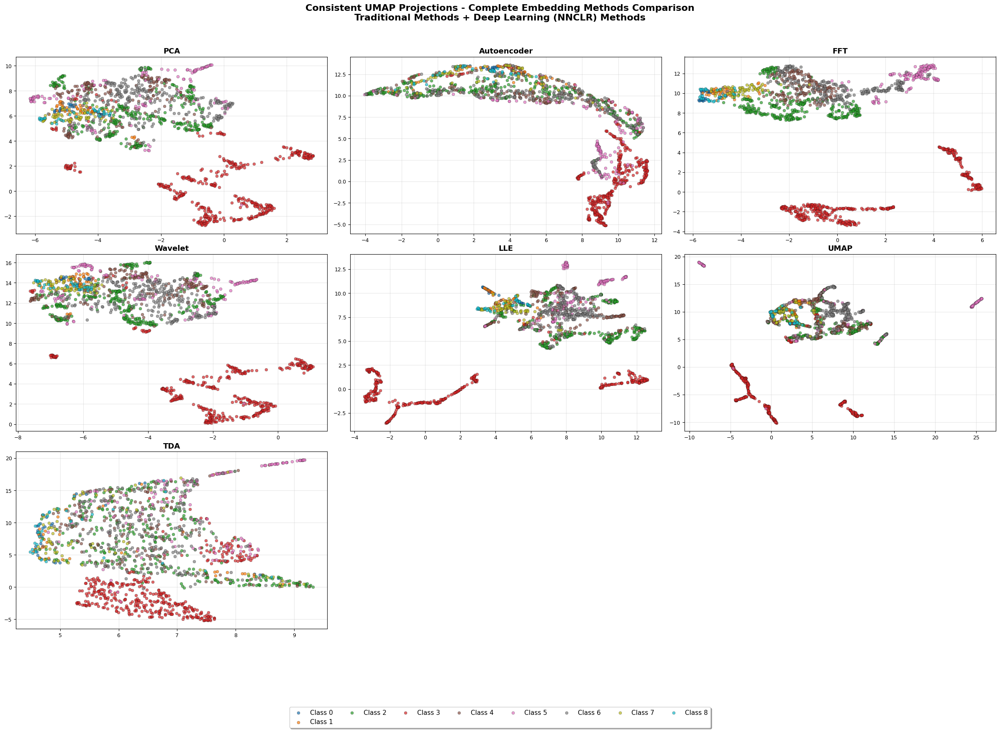


STEP 4: Creating deep learning methods comparison...
--------------------------------------------------
No deep learning methods available for separate comparison.

🎉 COMPREHENSIVE ANALYSIS COMPLETE!
✅ Successfully processed 7 embedding methods
✅ Successfully created 7 UMAP visualizations
✅ Comprehensive comparison plot created
✅ All plots saved and displayed

Now you can compare:
• Traditional embedding methods vs Deep Learning methods
• Different NNCLR architectures (CNN, LSTM, Transformer)
• Overall clustering quality across all approaches


In [ ]:
import Newplot4 as robust  # Replace with your filename

embeddings_results, layouts_2d = robust.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

COMPREHENSIVE ROBUST CONSISTENT UMAP ANALYSIS
Traditional Methods + Deep Learning (NNCLR) Methods

STEP 1: Generating embeddings...
--------------------------------------------------
Generating embeddings with robust error handling...
------------------------------------------------------------
Data shapes: Train=(4601, 151), Val=(1454, 151), Test=(1524, 151)

1. PCA Embedding:
  Processing PCA...
  ✓ PCA completed successfully

2. Autoencoder Embedding:
  Processing Autoencoder...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
  ✓ Autoencoder completed successfully

3. FFT Embedding:
  Processing FFT...
  ✓ FFT completed successfully

4. Wavelet Embedding:
  Processing Wavelet...
  ✓ Wavelet completed successfully

5. LLE Embedding:
  Processing LLE...
  ✓ LLE completed successfully

6. UMAP Embedding:
  Processing UMAP...
  ✓ UMAP completed successfully

7. Graph Embedding:

8. TDA Embedding:

DEEP LEARNING METHODS (NNCLR-based)

9. NNCLR CNN Embedding:

10. NNCLR LSTM Embedding:

11. NNCLR Transformer Embedding:

Successfully generated 6 out of 11 embedding methods:
  ✓ PCA
  ✓ Autoencoder
  ✓ FFT
  ✓ Wavelet
  ✓ LLE
  ✓ UMAP
Failed methods: NNCLR LSTM, NNCLR Transformer, TDA, NNCLR CNN, Graph

STEP 2: Creating consistent UMAP layouts...
--------------------------------------------------
Creating consistent UMAP layouts using PCA as reference...
  PCA test embedding shape: (1524, 96)
  Aut

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  Reference layout shape: (1524, 2)
Generating layout for PCA...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ PCA layout created: (1524, 2)
Generating layout for Autoencoder...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Autoencoder layout created: (1524, 2)
Generating layout for FFT...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ FFT layout created: (1524, 2)
Generating layout for Wavelet...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ Wavelet layout created: (1524, 2)
Generating layout for LLE...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ LLE layout created: (1524, 2)
Generating layout for UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  ✓ UMAP layout created: (1524, 2)

Successfully created 6 consistent UMAP layouts!

STEP 3: Creating comprehensive visualization...
--------------------------------------------------
Creating grid plot: 2x3 for 6 methods
Found 9 unique classes: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Plot saved to: comprehensive_consistent_umap_comparison.png


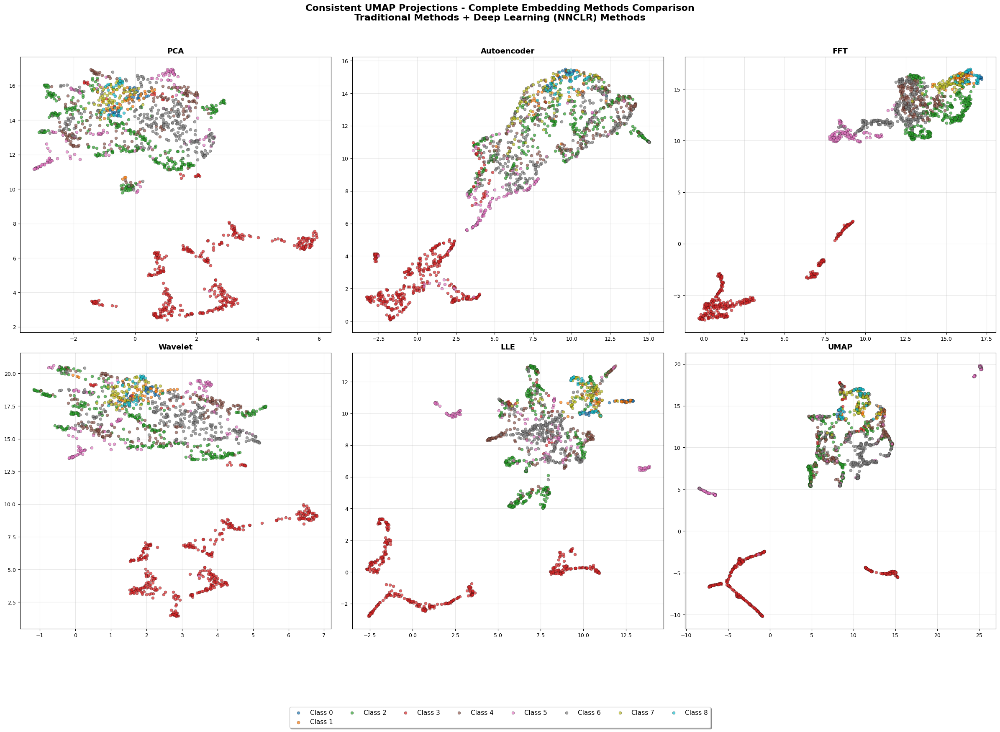


STEP 4: Creating deep learning methods comparison...
--------------------------------------------------
No deep learning methods available for separate comparison.

🎉 COMPREHENSIVE ANALYSIS COMPLETE!
✅ Successfully processed 6 embedding methods
✅ Successfully created 6 UMAP visualizations
✅ Comprehensive comparison plot created
✅ All plots saved and displayed

Now you can compare:
• Traditional embedding methods vs Deep Learning methods
• Different NNCLR architectures (CNN, LSTM, Transformer)
• Overall clustering quality across all approaches


In [ ]:
import Newplot7 as robust  # Replace with your filename

embeddings_results, layouts_2d = robust.main_robust_umap_analysis(
    train_sct, val_sct, test_sct, ny_train, ny_val, ny_test
)

Individual plot saved: individual_(a)_pca_umap.png


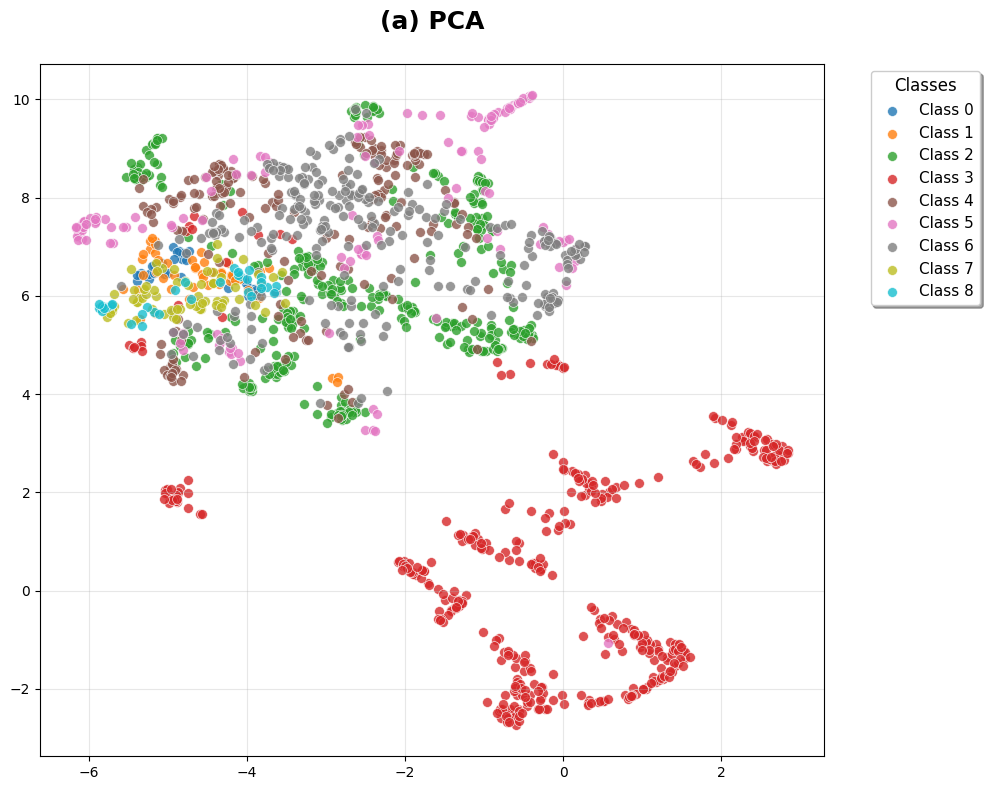

In [ ]:
robust.plot_individual_method(layouts_2d, 'PCA', ny_test, custom_label='(a) PCA')

Individual plot saved: individual_(b)_wavelet_umap.png


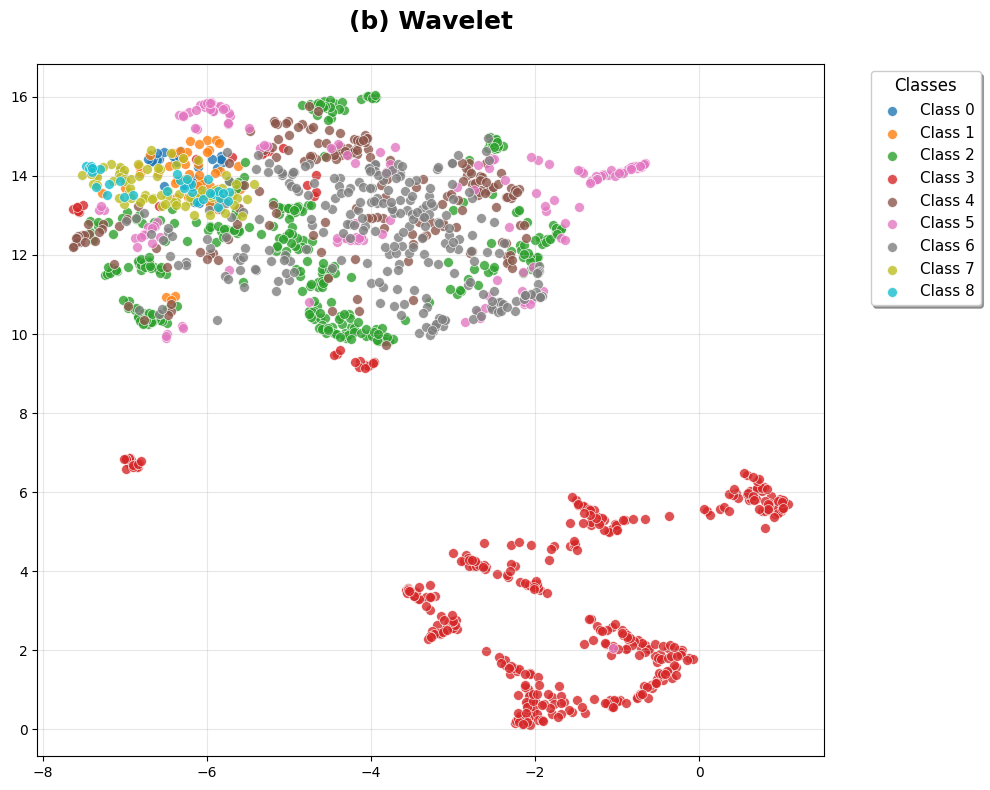

In [ ]:
robust.plot_individual_method(layouts_2d, 'Wavelet', ny_test, custom_label='(b) Wavelet')

Individual plot saved: individual_(c)_fft_umap.png


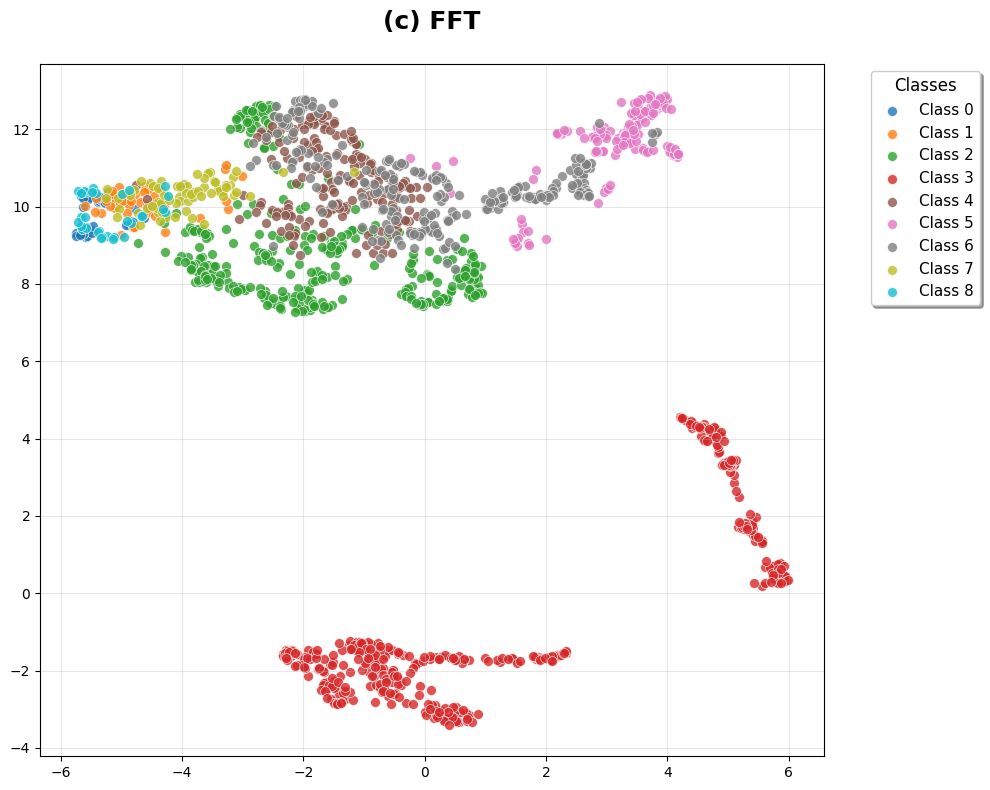

In [ ]:
robust.plot_individual_method(layouts_2d, 'FFT', ny_test, custom_label='(c) FFT')

Individual plot saved: individual_(d)_lle_umap.png


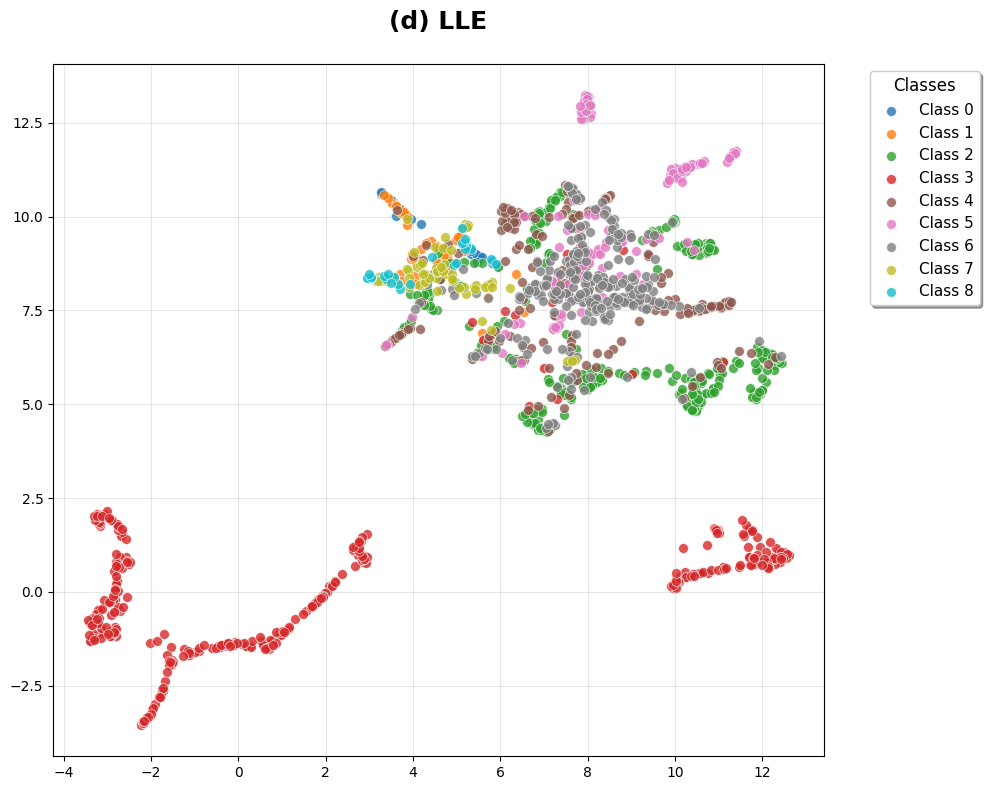

In [ ]:
robust.plot_individual_method(layouts_2d, 'LLE', ny_test, custom_label='(d) LLE')

Individual plot saved: individual_(e)_umap_umap.png


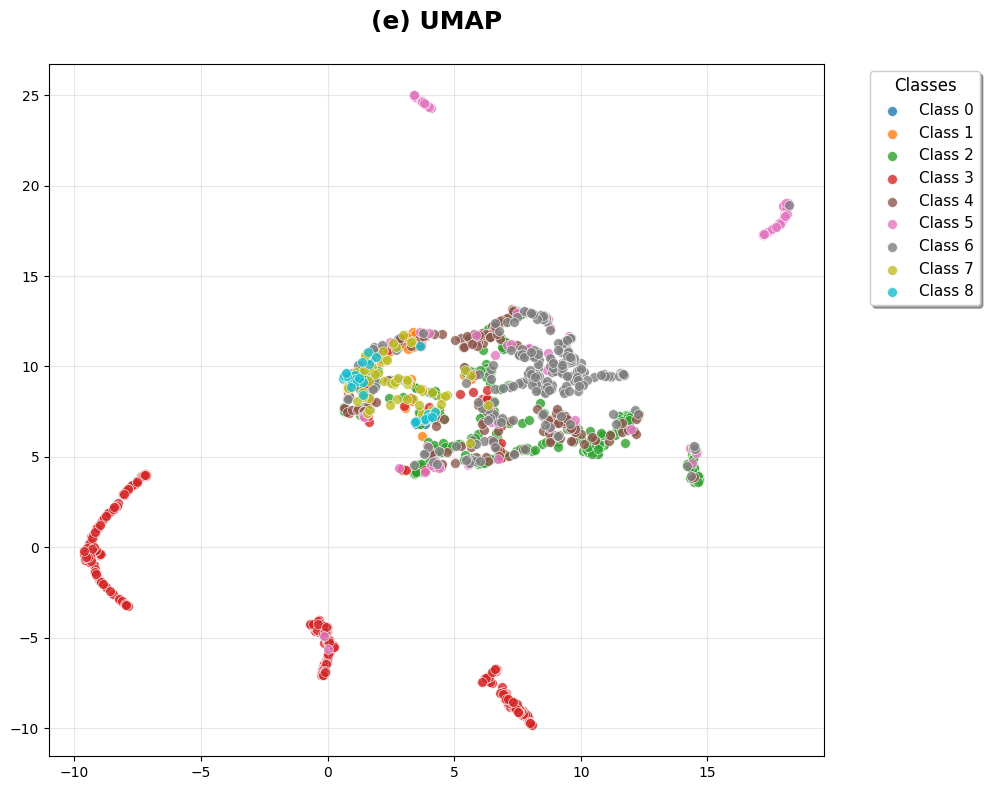

In [ ]:
robust.plot_individual_method(layouts_2d, 'UMAP', ny_test, custom_label='(e) UMAP')

Individual plot saved: individual_(f)_graph_umap.png


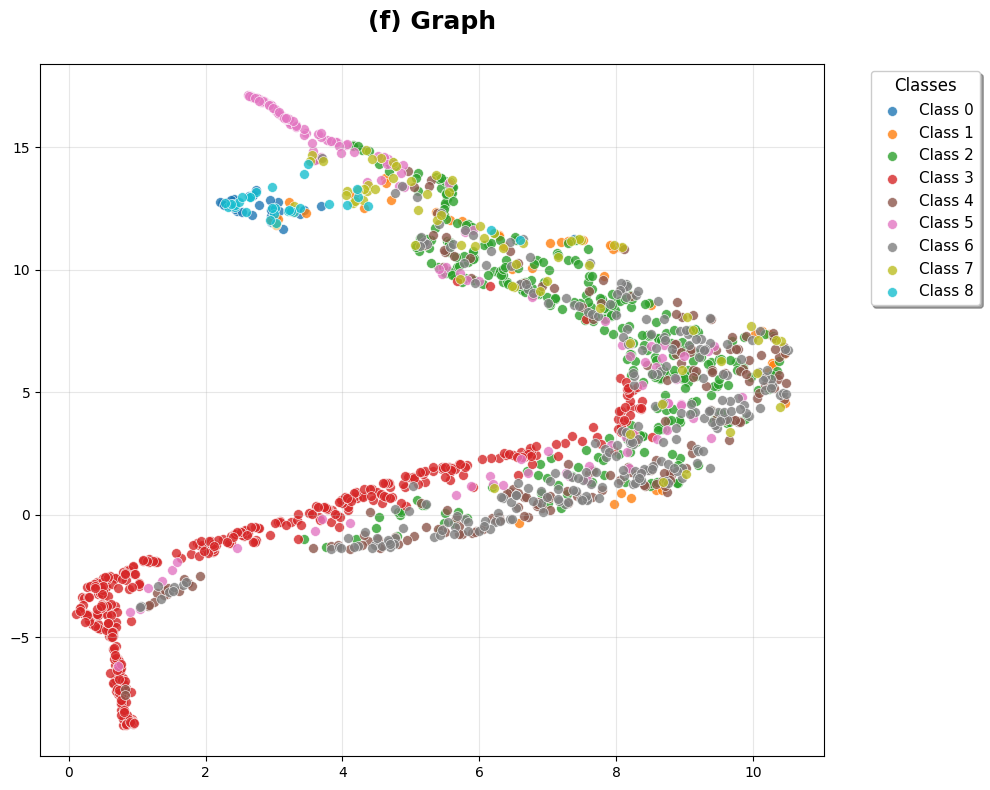

In [ ]:
robust.plot_individual_method(layouts_2d, 'Graph', ny_test, custom_label='(f) Graph')

Individual plot saved: individual_(g)_tda_umap.png


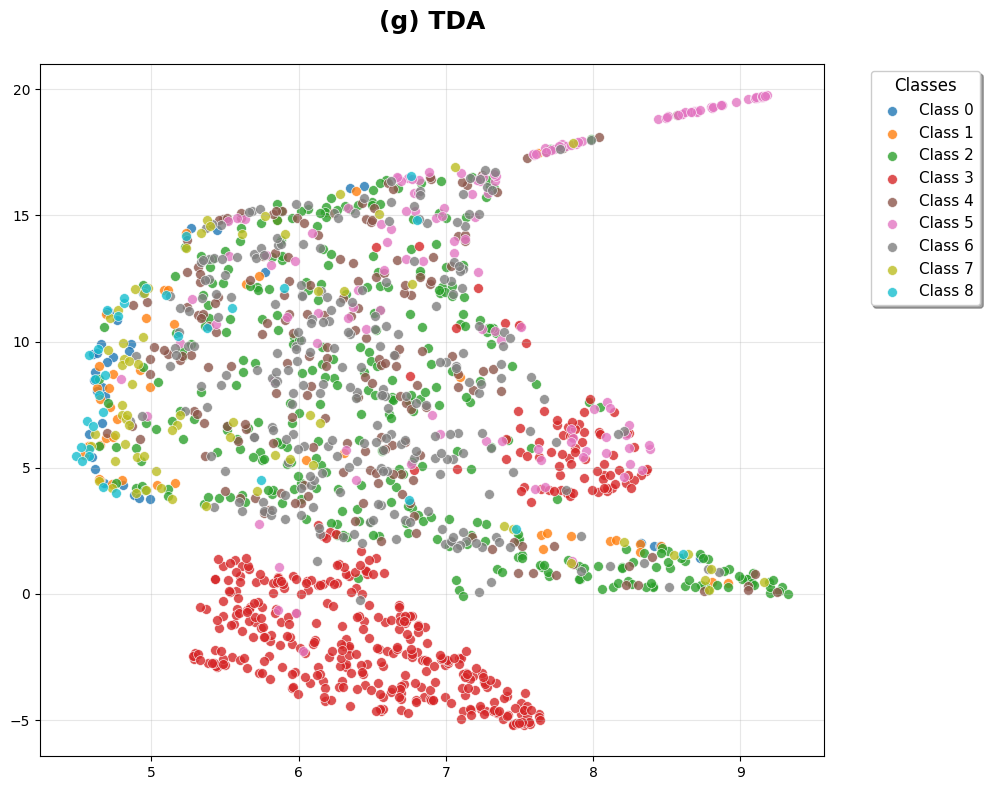

In [ ]:
robust.plot_individual_method(layouts_2d, 'TDA', ny_test, custom_label='(g) TDA')

Individual plot saved: individual_(h)_ae_umap.png


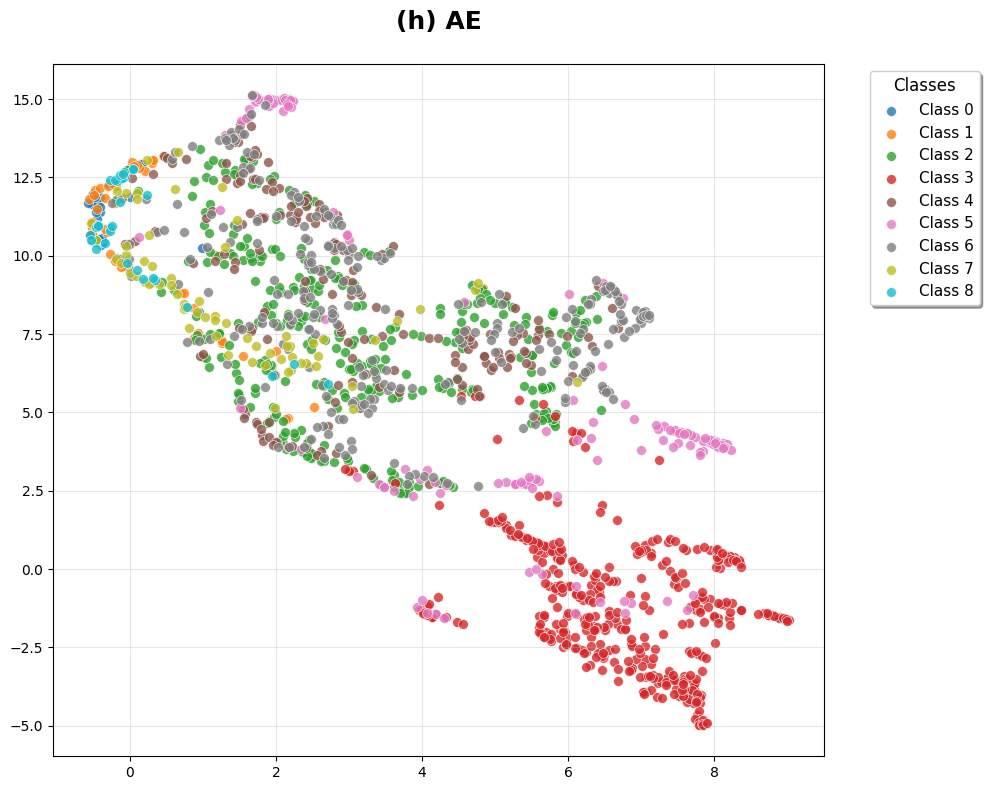

In [ ]:
robust.plot_individual_method(layouts_2d, 'Autoencoder', ny_test, custom_label='(h) AE')

Individual plot saved: individual_(i)_nnclr_cnn_umap.png


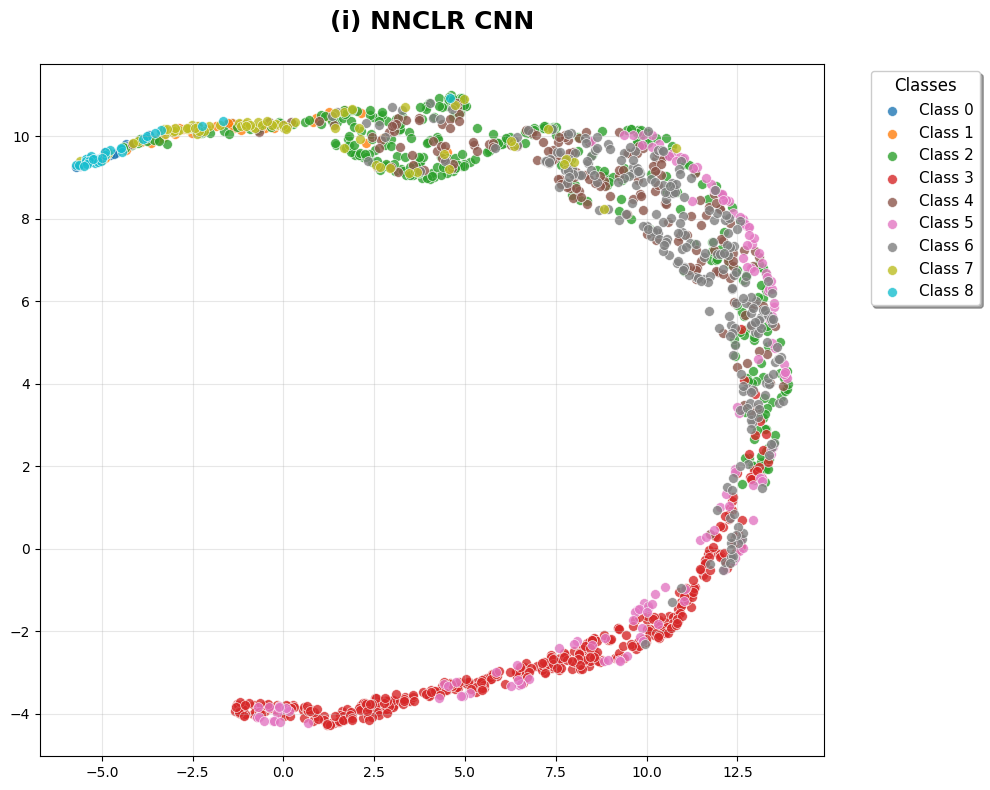

In [ ]:
robust.plot_individual_method(layouts_2d, 'NNCLR CNN', ny_test, custom_label='(i) NNCLR CNN')

Individual plot saved: individual_(j)_nnclr_lstm_umap.png


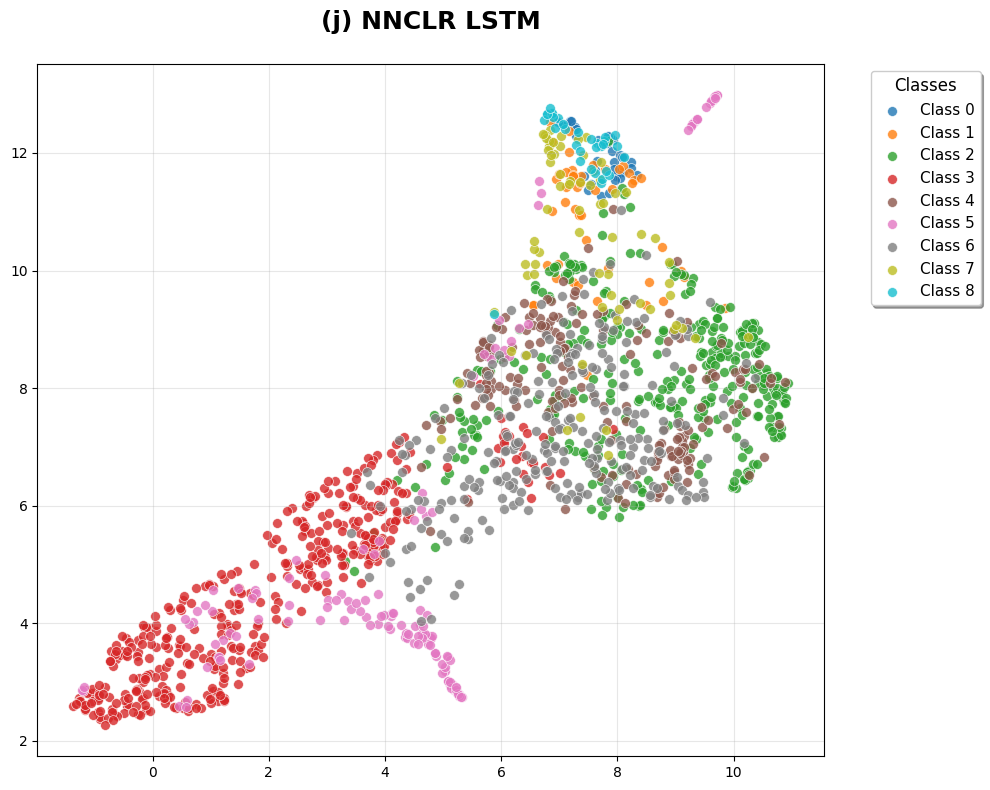

In [ ]:
robust.plot_individual_method(layouts_2d, 'NNCLR LSTM', ny_test, custom_label='(j) NNCLR LSTM')

Individual plot saved: individual_(a)_pca_umap.png


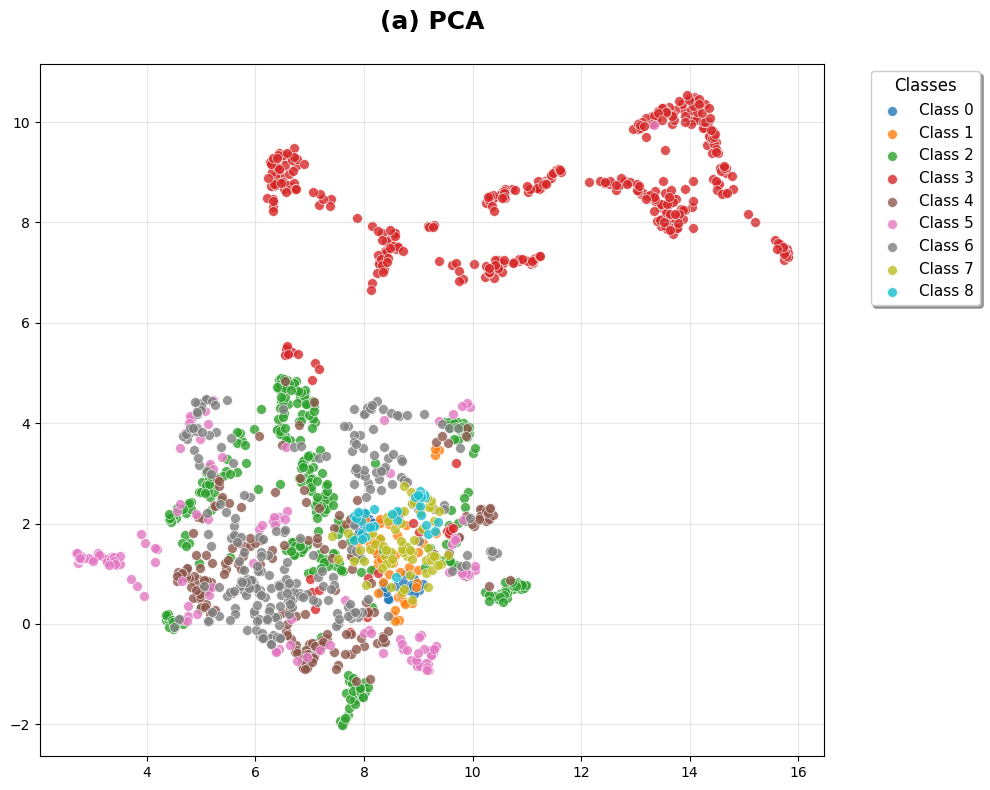

In [ ]:
robust.plot_individual_method(layouts_2d, 'PCA', ny_test, custom_label='(a) PCA')

Individual plot saved: individual_(b)_wavelet_umap.png


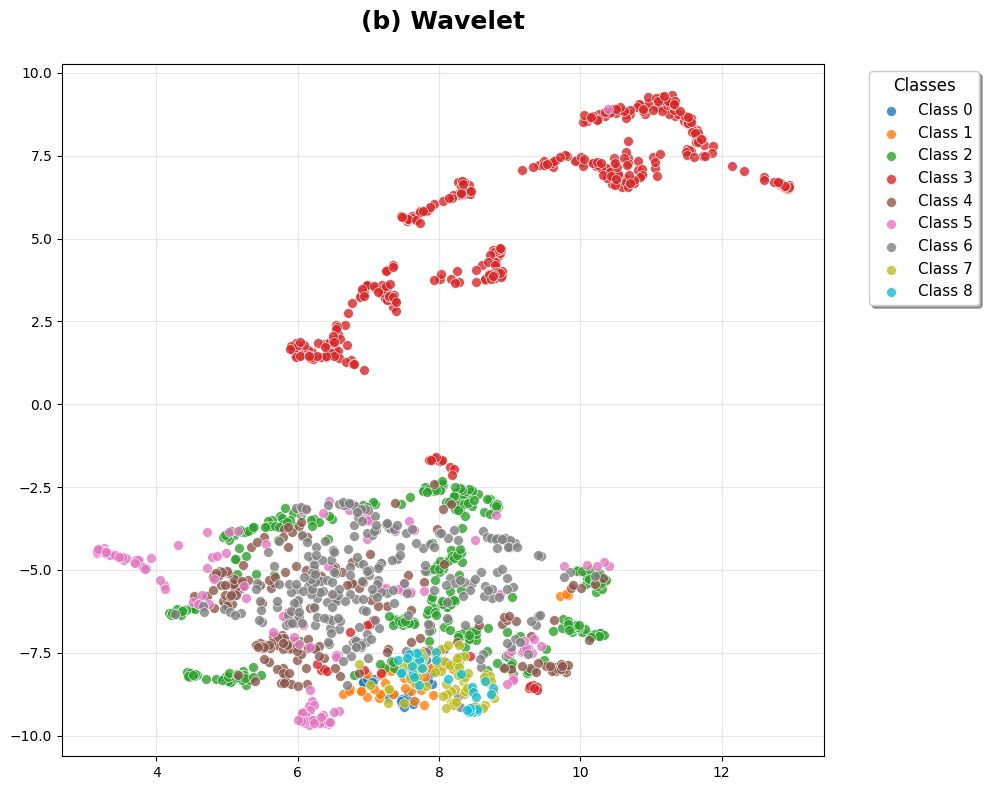

In [ ]:
robust.plot_individual_method(layouts_2d, 'Wavelet', ny_test, custom_label='(b) Wavelet')

Individual plot saved: individual_(c)_fft_umap.png


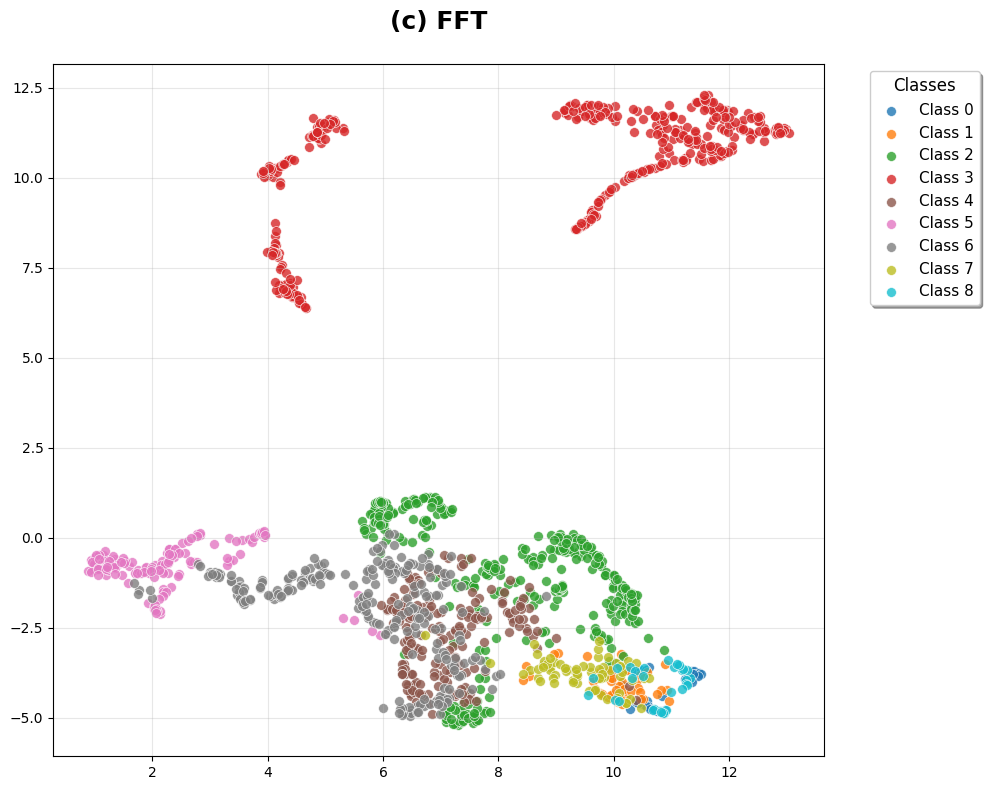

In [ ]:
robust.plot_individual_method(layouts_2d, 'FFT', ny_test, custom_label='(c) FFT')

Individual plot saved: individual_(d)_lle_umap.png


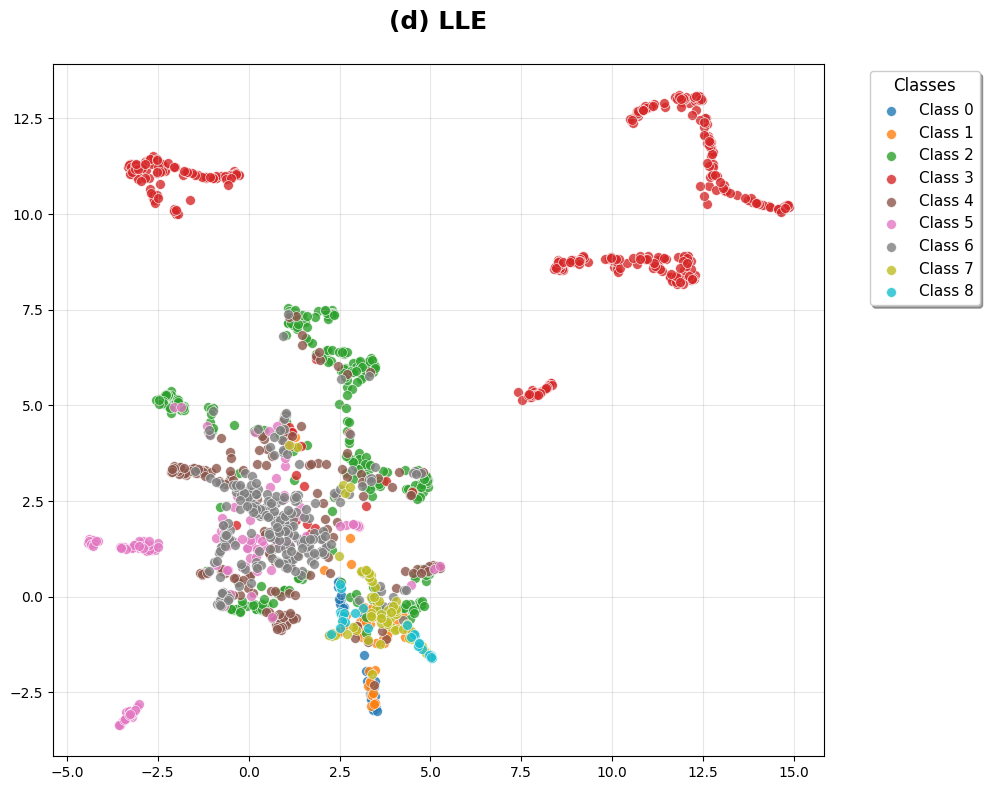

In [ ]:
robust.plot_individual_method(layouts_2d, 'LLE', ny_test, custom_label='(d) LLE')

Individual plot saved: individual_(e)_umap_umap.png


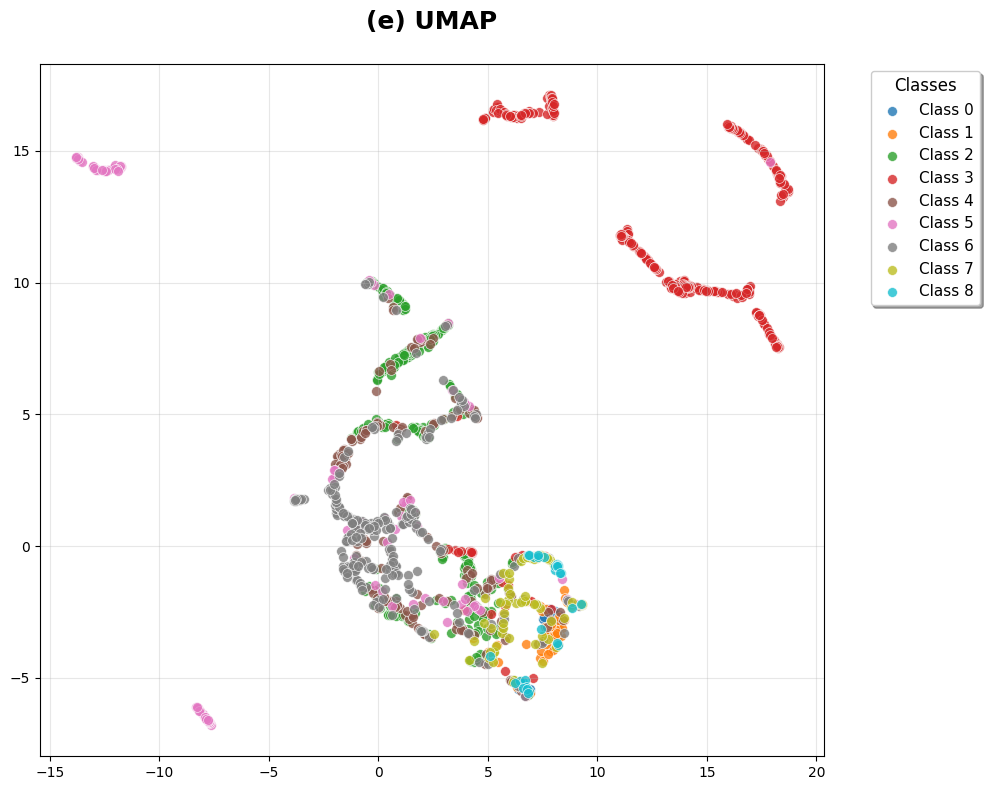

In [ ]:
robust.plot_individual_method(layouts_2d, 'UMAP', ny_test, custom_label='(e) UMAP')

Individual plot saved: individual_(g)_tda_umap.png


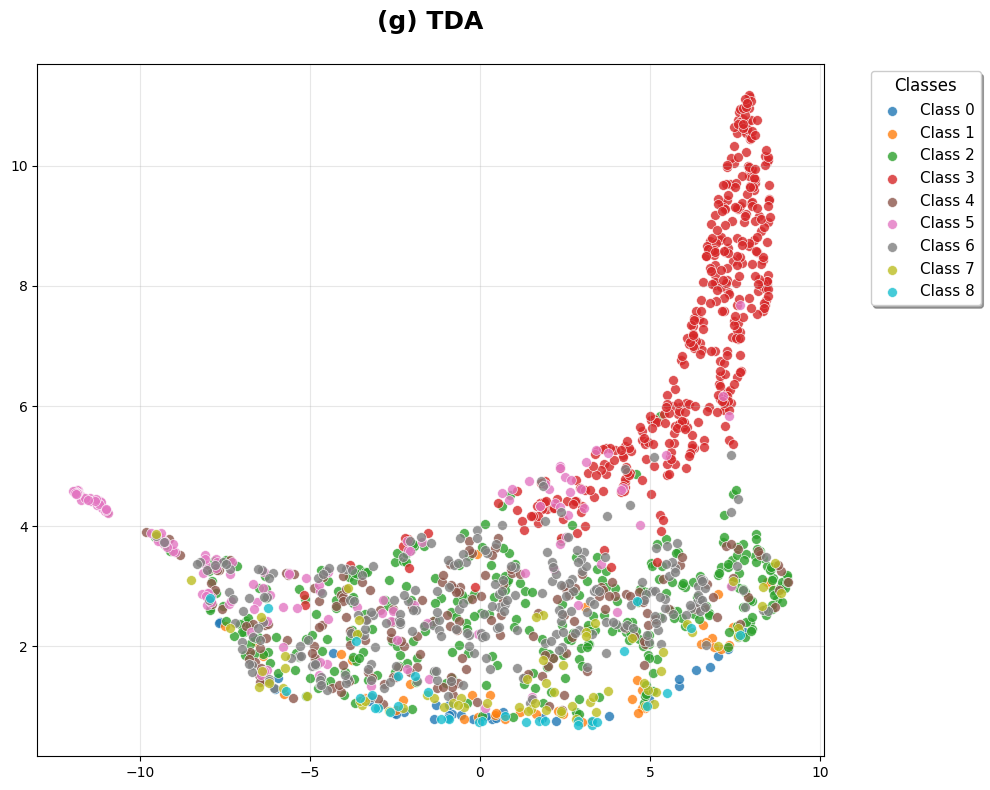

In [ ]:
robust.plot_individual_method(layouts_2d, 'TDA', ny_test, custom_label='(g) TDA')